## <center><b>UNIVERSIDADE DE SÃO PAULO (USP)</b></center>
### <center><b>INSTITUTO DE CIÊNCIAS MATEMÁTICAS E COMPUTAÇÃO (ICMC)</b></center>
### <center><b>DISCIPLINA</b>: Introdução à Ciência de Dados (SME0828)</center>

### <center><b>PROJETO FINAL (2023)</b></center>
#### <b>DOCENTE</b>:
#### &emsp;     - Francisco Aaparecido Rodrigues
#### <b>DISCENTES</b>:
#### &emsp;     - Carlos Filipe de Castro Lemos (12542630)
#### &emsp;     - Davi Fagundes Ferreira da Silva (12544013)
#### &emsp;     - João Gabriel Sasseron Roberto Amorim (12542564)

# CONFIGURAÇÕES

## Bibliotecas Utilizadas

Na execução deste projeto, empregamos bibliotecas Python que disponibilizam uma ampla gama de funcionalidades essenciais para a Ciência de Dados, incluindo `scikit-learn`, `pandas` e `numpy`. Além disso, aproveitamos as diretrizes de visualização gráfica através de bibliotecas como `Matplotlib`, `Plotly` e `Seaborn`.

In [97]:
# Bibliotecas
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

# Configurações adicionais
import warnings
from sklearn.exceptions import DataConversionWarning,ConvergenceWarning

# Pacotes de Preprocessamento e Preparação dos Dados e Modelos
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.model_selection import KFold, GridSearchCV, train_test_split
from sklearn.manifold import TSNE

# Pacotes de Avalição dos Modelos
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.metrics import f1_score, make_scorer
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix
from sklearn.metrics import homogeneity_score, completeness_score, rand_score
from sklearn.metrics import adjusted_mutual_info_score, mutual_info_score
from sklearn.metrics import adjusted_rand_score, fowlkes_mallows_score
from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import KElbowVisualizer

# Modelos de Classificação Utilizados no trabalho
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN, KMeans
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression, Perceptron, RidgeClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

## Configurações Globais

In [98]:
# Desligando warnings para melhor experiência
warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.filterwarnings("ignore", category=DataConversionWarning)

# Destravando limitações na exibição de tabelas
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.3f}'.format

## Funções Úteis

In [99]:
def calculate_metrics(classificador, y_target, y_predicted) -> list:
    """ 
    Função especializada na padronização da exibição de métricas (Accuracy, Precision, Recall e F1-Score). 
    Calcula e exibe métricas de treinamento, validação e teste.
    @param(classificador): recebe o nome do classificador (string).
    @param(y_target): recebe a variável alvo (conjunto de dados).
    @param(y_predicted): recebe a predição do classificador (conjunto de dados).
    @retorno: retorna o cálculo das seguintes métricas: a acurácia, recall, precision e f1-score.
    """

    acuracia    = accuracy_score(y_target, y_predicted)
    recall      = recall_score(y_target, y_predicted)
    precision   = precision_score(y_target, y_predicted)
    f1          = f1_score(y_target, y_predicted)

    global df_results
    resultados = df_results.loc[df_results['Classificador'] == classificador]

    print(f"###############################################################################################################")
    print(f"                                      {classificador.upper()}")
    print(f"###############################################################################################################")
    print(f"Accuracy (Treino): \t {resultados.iloc[0,5]:.4f} \tAccuracy (Validação): \t {resultados.iloc[0,4]:.4f} \tAccuracy (Teste): \t {acuracia:.4f}")
    print(f"Precision (Treino):\t {resultados.iloc[0,7]:.4f} \tPrecision (Validação):\t {resultados.iloc[0,6]:.4f} \tPrecision (Teste):\t {precision:.4f}")
    print(f"Recall  (Treino):  \t {resultados.iloc[0,9]:.4f} \tRecall  (Validação):  \t {resultados.iloc[0,8]:.4f} \tRecall  (Teste):  \t {recall:.4f}")
    print(f"F1-Score (Treino): \t {resultados.iloc[0,11]:.4f} \tF1-Score (Validação):\t {resultados.iloc[0,10]:.4f} \tF1-Score (Teste): \t {f1:.4f}")
    print(f"Parâmetros de Otimização: {resultados.iloc[0,16]}")

    print("\nObservação: os valores de treino e de validação são valores médios originados no GridSearchCV.\n\n")

    return [acuracia, precision, recall, f1]

In [100]:
def plot_ROC_CM(classificador, y_target, y_predicted) -> None:
    """ 
    Função especializada na elaboração de dois gráficos: Matriz de Confusão e Curva ROC.
    @param(classificador): recebe o nome do classificador (string).
    @param(y_target): recebe a variável alvo (conjunto de dados).
    @param(y_predicted): recebe a predição do classificador (conjunto de dados).
    @retorno: não há retorno
    """
    ## Coleta dados confusion matrix
    classes = np.unique(y_target)
    cm = confusion_matrix(y_target, y_predicted)

    # ROC_AUC score
    roc_auc = roc_auc_score(y_target, y_predicted)
    
    # Plotando gráficos de Matrix de Confusão e Curva ROC
    fig = plt.figure(figsize=(15,5))
    fig.suptitle(f'Gráficos: Matrix de Confusão e Curva ROC ({classificador.upper()})', fontsize=20)
    
    # Plotando Matrix de Confusão
    fig.add_subplot(121)
    sns.heatmap(cm, 
                square=True,
                annot=True, 
                cbar=True,
                xticklabels=classes, 
                yticklabels=classes, 
                fmt='d', 
                cmap=plt.cm.Blues)
    plt.title(f"Matriz de Confusão")
    plt.xlabel("Label Original")
    plt.ylabel("Label Classificado")
    plt.yticks(rotation=0)

    # Plotando Curva Roc
    fig.add_subplot(122)
    fpr, tpr, thresholds = roc_curve(y_target, y_predicted)
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'Curva ROC (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('Falso Positivo')
    plt.ylabel('Verdadeiro Positivo')
    plt.title(f'Curva ROC da Classificação')
    plt.legend(loc='lower right')

    plt.show(fig)

In [101]:
def calculate_metrics_cluster(X_test, y_test, predicted, x_grafico, y_grafico, classificador):
    """ 
    Função de finalidade múltipla. Sua primeira parte calcula diversas métricas de avaliação de algoritmos
    de clusterização. Em seguida, exibe um relatório de seus valores ao usuário. Por fim, exibe o conjunto 
    de dados em duas dimensões, mostrando o resultado da classificação.
    @param(classificador): recebe o nome do classificador (string).
    @param(x_test): conjunto de dados que se refere às características de classificação.
    @param(y_test): conjunto de dados que se refere à variável alvo da classificação.
    @param(predicted): resultado da classificação.
    @param(x_grafico): dimensão X do conjunto de dados (depois da redução de dimensionalidade).
    @param(y_grafico): dimensão Y do conjunto de dados (depois da redução de dimensionalidade).
    @retorno: não há retorno
    """
    homogeneity = homogeneity_score(y_test, predicted)
    completeness = completeness_score(y_test, predicted)
    adjusted_mutual_info_scores = adjusted_mutual_info_score(y_test, predicted)
    multual_info_scores = mutual_info_score(y_test, predicted)
    rand_scores = rand_score(y_test, predicted)
    adjusted_rand_scores = adjusted_rand_score(y_test, predicted)
    fowlkes_mallows_scores = fowlkes_mallows_score(y_test, predicted)
    calinski_harabasz_scores = calinski_harabasz_score(X_test, predicted)
    davies_bouldin_scores = davies_bouldin_score(X_test, predicted)
    silhouette_scores = silhouette_score(X_test, predicted)

    print(f"###############################################################################################################")
    print(f"                                      {classificador.upper()}")
    print(f"###############################################################################################################")
    print(f"\n\t\t\t\tESTATISTICAS DE AVALIAÇÃO")
    print(f'- Homogeneity: {homogeneity:.4f}')
    print(f'- Completeness: {completeness:.4f}')
    print(f'- Mutual Info Score: {multual_info_scores:.4f}')
    print(f'- Adjusted Mutual Info Score: {adjusted_mutual_info_scores:.4f}')
    print(f'- Rand Score: {rand_scores:.4f}')
    print(f'- Adjusted Rand Score: {adjusted_rand_scores:.4f}')
    print(f'- Fowlkes Mallows Score: {fowlkes_mallows_scores:.4f}')
    print(f'- Calinski HaraBasz Score: {calinski_harabasz_scores:.4f}')
    print(f'- Davies Bouldin Score: {davies_bouldin_scores:.4f}')
    print(f'- Silhoutte Scores: {silhouette_scores:.4f}', end='\n\n')


    # Plotando gráfico de Componentes do t-SNE
    target = predicted.tolist()
    data_frame = pd.DataFrame({'Componente t-SNE 1': x_grafico, 'Componente t-SNE 2': y_grafico, 'Target': target})
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=data_frame, x=x_grafico, y=y_grafico, hue='Target')
    plt.xlabel('Componente t-SNE 1')
    plt.ylabel('Componente t-SNE 2')
    plt.title('Gráfico de Dispersão dos Componentes do t-SNE')
    plt.legend(title='Target')
    plt.show()

In [102]:
def results_metrics(classificador, resultados):
    """
    Função utilizada na parte de avaliação de modelos testados. Serve exclusivamente para padronizar a apresentação de resultados.
    @param(classificador): recebe o nome do classificador (string).
    @param(resultados): recebe a tabela com os resultados da classificação.
    @retorno: não há.
    """
    dados_train = resultados.loc[resultados['Classificador'] == classificador, ['Accuracy (Treino)', 'Precision (Treino)', 'Recall (Treino)', 'F1Score (Treino)']]
    dados_validation = resultados.loc[resultados['Classificador'] == classificador, ['Accuracy (Validação)', 'Precision (Validação)', 'Recall (Validação)', 'F1Score (Validação)']]
    data_test = resultados.loc[resultados['Classificador'] == classificador, ['Accuracy (Teste)', 'Precision (Teste)', 'Recall (Teste)', 'F1Score (Teste)']]
    

    print(f'\t\t\tDADOS DOS RESULTADOS DO CLASSIFICADOR {classificador.upper()}')
    print('Treino:')
    print(f'\tAccuracy (Treino):\t {dados_train.iloc[0,0]:.4f}')
    print(f'\tPrecision (Treino):\t {dados_train.iloc[0,1]:.4f}')
    print(f'\tRecall (Treino):\t {dados_train.iloc[0,2]:.4f}')
    print(f'\tF1Score (Treino):\t {dados_train.iloc[0,3]:.4f}')
    
    print('Validação:')
    print(f'\tAccuracy (Validação):\t {dados_validation.iloc[0,0]:.4f}')
    print(f'\tPrecision (Validação):\t {dados_validation.iloc[0,1]:.4f}')
    print(f'\tRecall (Validação):\t {dados_validation.iloc[0,2]:.4f}')
    print(f'\tF1Score (Validação):\t {dados_validation.iloc[0,3]:.4f}')

    print('Teste:')
    print(f'\tAccuracy (Teste):\t {data_test.iloc[0,0]:.4f}')
    print(f'\tPrecision (Teste):\t {data_test.iloc[0,1]:.4f}')
    print(f'\tRecall (Teste):\t\t {data_test.iloc[0,2]:.4f}')
    print(f'\tF1Score (Teste):\t {data_test.iloc[0,3]:.4f}')

In [103]:
def graficos_barras_pizza(x, y, variavel):  
    """ 
    Função utilizada na análise explorátória dos dados, de modo a padronizar a visualização dos dados.
    Em primeiro lugar, mostra um resumo numérico e, em seguida, mostra dois gráficos: um de barros e 
    um no formato de pizza.
    @param(x): recebe o nome dos valores (valores em X).
    @param(y): recebe a quantidade absoluta (valores de Y).
    @param(variavel): recebe o nome da variável (string).
    @retorno: não há.
    """ 
    
    # Dados numéricos
    print(f"A distribuição da variável '{variavel}' pode ser vista da seguinte forma:\n")
    print("\t\t<Valores únicos>: <quantidade de ocorrências>")
    for index, values in enumerate(x):
        print(f"\t\t-'{x[index]}': {y[index]}")

    # Plotando gráficos de Matrix de Confusão e Curva ROC
    fig = plt.figure(figsize=(10,4))
    fig.suptitle(f'Gráficos de Valores Categóricos de "{variavel.upper()}"', fontsize=20)

    # Gráfico de Barras
    fig.add_subplot(121)
    sns.barplot(x=x, y=y)
    plt.xlabel('Valores dos Dados')
    plt.ylabel('Quantidade Absoluta')

    # Gráfico de Pizza
    fig.add_subplot(122)
    plt.pie(y, labels=x, autopct='%1.1f%%', startangle=140)

    # Exibindo os gráficos
    plt.show()

# INTRODUÇÃO

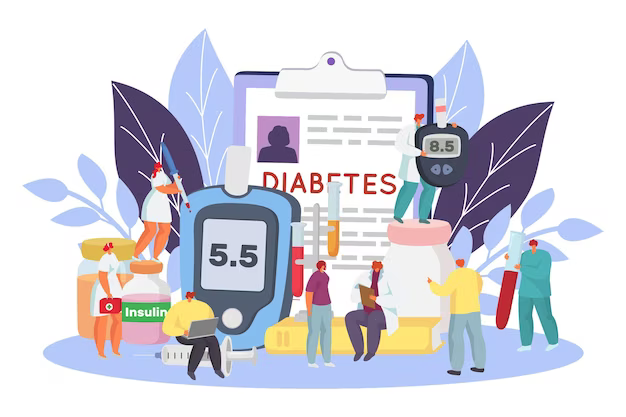

O diabetes é uma sindrome metabólica de origem múltipla, decorrente da falta de insulina ou da reduzida capacidade de a insulina exercer adequadamente suas funções. Caso não seja tratada, as complicações aparentemente inocentes podem evoluir para lesões na retina, distúrbios neurológicos, ulcerações nos pés, infecções variadas, bem como infartos ou acidentes vasculares. Vale ainda acrescentar que mais de 13 milhões de brasileiros são afetados pela doença, o que representa 6,9% da população nacional (dados divulgados pela [Sociedade Brasileira de Diabetes](https://diabetes.org.br/)). Essa condição gera impactos na qualidade de vida das pessoas e problemas de saúde pública (especialmente relacionados com gastos orçamentários), mas podem ser minimizados se houver diagnóstico prematuro. Portanto, é de extrema importância compreender a natureza dessa enfermidade e desenvolver mecanismos eficazes para identificar indivíduos adoecidos ou potencialmente alvo da doença. 

Nesse contexto, o presente projeto tem como objetivo analisar banco de dados representativo de indivíduos acometidos pelo diabetes. Esses banco de dados foi obtidas no Kaggle, cujo dataset foi denominado ["Diabetes Prediction Dataset"](https://www.kaggle.com/datasets/iammustafatz/diabetes-prediction-dataset/data). Vale dizer que ele é formado por variáveis preditoras (`predictor variables`) e por uma variável alvo (`target variable`). Desse modo, por um lado, teremos uma relação com várias características informativas (como idade, gênero, índice de massa corporal, hipertensão, doença cardíaca, histórico de tabagismo, nível de HbA1c e nível de glicose no sangue); mas, por outro, teremos posse da informação se as pessoas eram ou não diabéticas (diagnósticos positivos ou negativos). Com base nessas características, a expectativa é de que seremos capazes de utilizar mecanismos de Ciência de Dados e de Machine Learning para realizar uma decisão informada, predizendo se uma pessoa é ou não diabética ou se tem potencialidade de ser.

De modo mais específico, podemos descrever os atributos do banco de dados da seguinte forma:

* `gender`: refere-se ao sexo biológico do indivíduo, o que pode aumentar ou diminuir a suscetibilidade ao diabetes.
* `age`: a idade é um fator importante uma vez que o diabetes é mais comumente diagnosticado em adultos e em idosos. Os valores dessa variável variam de 0 a 80 anos.
* `hypertension`: a hipertensão é uma condição médica na qual a pressão sanguínea nas artérias está persistentemente elevada. A presença da doença foi codificada em valores binários, sendo 1 (um) positivo para hipertensão.
* `hearth_disease`: problemas cardiovasculares são outras condições médicas que estão associadas a um maior risco de desenvolver diabetes. A presença da doença foi codificada em valores binários, sendo 1 (um) positivo para doenças cardiovasculares.
* `smoking_history`: o histórico de tabagismo também é considerado um fator de risco para o diabetes e pode agravar as complicações. Em nosso conjunto de dados, temos 5 categorias, ou seja, não atual, ex-tabagista, Sem Informações, atual, nunca e sempre.
* `bmi`: proveniente do inglês 'body mass index', o IMC (Índice de Massa Corporal) é uma medida de gordura corporal com base no peso e altura. Valores de IMC mais altos estão relacionados a um maior risco.
* `HbA1c_level`: o nível de Hemoglobina A1c é uma medida do nível médio de açúcar no sangue de uma pessoa nos últimos 2-3 meses.
* `blood_glucose_level`: o nível de glicose no sangue se refere à quantidade de glicose na corrente sanguínea circulante em um determinado momento.
* `diabetes`: é a variável alvo a ser prevista, a qual é representada por valores binários, sendo 1 (um) a presença de diabetes e 0 (zero) a ausência.


# DESENVOLVIMENTO

## Análise Exploratória dos Dados

O primeiro passo fundamental na Ciência de Dados é compreender o conjunto de dados que será analisado e processado. Essa etapa envolve a exploração da estrutura, da qualidade e da composição dos dados, o que pode favorecer a aquisição de conhecimento para uma base sólida de análises subsequentes. Ressalte-se que a compreensão abrangente dos dados é essencial para identificar padrões, tendências e insights valiosos, os quais impulsionarão as decisões e descobertas ao longo do projeto de Ciência de Dados. 

### Carregamento do Dataset

In [104]:
# Carregamento da base de dados
path = "data/diabetes_prediction_dataset.csv"
df = pd.read_csv(path)

### Estrutura dos Dados

Informações iniciais sobre a estrutura dos dados:

In [105]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   gender               100000 non-null  object 
 1   age                  100000 non-null  float64
 2   hypertension         100000 non-null  int64  
 3   heart_disease        100000 non-null  int64  
 4   smoking_history      100000 non-null  object 
 5   bmi                  100000 non-null  float64
 6   HbA1c_level          100000 non-null  float64
 7   blood_glucose_level  100000 non-null  int64  
 8   diabetes             100000 non-null  int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 6.9+ MB


A estrutura dos dados pode ser resumida em uma tabela de 9 (nove) colunas e 100000 (cem mil) registros. Os registros serão avaliados posteriormente, mas, com relação às colunas, podemos descrevê-las da seguinte forma:

* `gender`: refere-se ao sexo biológico do indivíduo, o que pode aumentar ou diminuir a suscetibilidade ao diabetes. Trata-se de variável categórica (object) que apresenta três valores ("Male", "Female" e "Other").
* `age`: a idade é um fator importante uma vez que o diabetes é mais comumente diagnosticado em adultos e em idosos. Trata-se de variável numérica contínua (float64), cujos valores variam de 0 a 80 anos .
* `hypertension`: a hipertensão é uma condição médica na qual a pressão sanguínea nas artérias está persistentemente elevada. A presença da doença foi codificada em valores binários, sendo 1 (um) positivo para hipertensão e o 0 (zero) como ausência da condição.
* `hearth_disease`: problemas cardiovasculares são outras condições médicas que estão associadas a um maior risco de desenvolver diabetes. A presença da doença foi codificada em valores binários, sendo 1 (um) positivo para doenças cardiovasculares e o 0 (zero) como ausência de doenças.
* `smoking_history`: o histórico de tabagismo também é considerado um fator de risco para o diabetes e pode agravar as complicações. Em nosso conjunto de dados, a variável é do tipo categórica e temos 5 categorias, ou seja, "não atual", "ex-tabagista", "Sem Informações", "atual", "nunca" e "sempre".
* `bmi`: proveniente do inglês 'body mass index', trata-se do Índice de Massa Corporal (IMC), que é uma medida de gordura do corpo com base no peso e altura. Valores de IMC mais altos estão relacionados a um maior risco.
* `HbA1c_level`: o nível de Hemoglobina A1c é uma medida do nível médio de açúcar no sangue de uma pessoa nos últimos 2-3 meses.
* `blood_glucose_level`: o nível de glicose no sangue se refere à quantidade de glicose presente na corrente sanguínea circulante em um determinado momento.
* `diabetes`: é a variável alvo, a qual sinaliza a anotação da presença ou a ausência do diabetes. Ela é representada por valores binários, sendo 1 (um) a presença de diabetes e 0 (zero) a ausência.

In [106]:
# Nome das colunas: verificação técnica da escrita para avaliar a necessidade de se trocar o nome e facilitar o código.
df.columns

Index(['gender', 'age', 'hypertension', 'heart_disease', 'smoking_history',
       'bmi', 'HbA1c_level', 'blood_glucose_level', 'diabetes'],
      dtype='object')

In [107]:
# Coletando variáveis por tipo: simplifica o acesso às variáveis
categoric = []
numeric = []

for name in df.columns:
    if df[name].dtypes == object: categoric.append(name)
    else: numeric.append(name)

print("Categoric: ", categoric)
print("Numeric: ", numeric)

Categoric:  ['gender', 'smoking_history']
Numeric:  ['age', 'hypertension', 'heart_disease', 'bmi', 'HbA1c_level', 'blood_glucose_level', 'diabetes']


### Valores dos Registros

Para garantir a integridade do conjunto de dados, realizaremos uma análise minuciosa das tuplas nulas e duplicadas eventualmente presentes no dataset. Essa avaliação é essencial para assegurar a qualidade dos dados e a sua consistência. As decisões tomadas durante esse processo serão devidamente explicadas, garantindo a transparência e a confiabilidade na manipulação dos dados.

#### Dados Duplicados

O primeiro passo na exploração dos dados é verificar a quantidade de dados duplicados. Caso a quantidade esteja muito grande, pode acontecer de ser gerado um modelo de classificação enviesado. Por isso, precisamos avaliá-los.

In [108]:
n = df.duplicated().sum()
print(f"A quantidade de linhas duplicadas é: {n}.")

A quantidade de linhas duplicadas é: 3854.


Agora, observaremos como os dados duplicados estão distribuídos no banco de dados:

In [109]:
df.value_counts()

gender  age     hypertension  heart_disease  smoking_history  bmi     HbA1c_level  blood_glucose_level  diabetes
Female  80.000  0             0              No Info          27.320  6.200        90                   0           9
                                                                      6.500        159                  0           9
                                                                      4.000        85                   0           8
                                                                      6.600        155                  0           7
                                                                      4.500        140                  0           7
                                                                      4.000        160                  0           7
                                                                                   126                  0           7
                                                             

Ao examinar os resultados acima, observamos que os dados duplicados não se limitam a um único registro, mas estão dispersos em centenas de registros. 

Assim, apesar de possuirmos 3854 registros duplicados, optamos por preservar esses valores. Esta decisão foi tomada para manter a representatividade da amostra (uma vez que a duplicação de valores pode ser uma ocorrência realística na vida cotidiana), bem como os registros duplicados estão pulverizados em centenas de entradas (o que não impacta diretamente o conjunto de dados). 

#### Dados Nulos

A quantidade de dados nulos pode impactar os algoritmos e a qualidade da classificação. Por isso, é preciso avaliar e corrigir eventuais falhas existentes. Por isso, iremos avaliar sua ocorrência.

In [110]:
print(f"Por coluna, a quantidade de dados nulos é:")
df.isnull().sum()

Por coluna, a quantidade de dados nulos é:


gender                 0
age                    0
hypertension           0
heart_disease          0
smoking_history        0
bmi                    0
HbA1c_level            0
blood_glucose_level    0
diabetes               0
dtype: int64

Em virtude da ausência de valores nulos, não será necessário efetuar qualquer intervenção no banco de dados.

### Variáveis Categóricas

Uma vez verificada a ocorrência de valores nulos e duplicados, passaremos a análise das variáveis categóricas.

In [111]:
print(f"A lista das variáveis categóricas é: {categoric}")

A lista das variáveis categóricas é: ['gender', 'smoking_history']


In [112]:
# Amostragem dos primeiros 5 registros
df[categoric].head(5)

,gender,smoking_history
0,Female,never
1,Female,No Info
2,Male,never
3,Female,current
4,Male,current


In [113]:
# Amostragem dos últimos 5 registros
df[categoric].tail(5)

,gender,smoking_history
99995,Female,No Info
99996,Female,No Info
99997,Male,former
99998,Female,never
99999,Female,current


#### Variável 'gender'

A distribuição da variável 'gender' pode ser vista da seguinte forma:

		<Valores únicos>: <quantidade de ocorrências>
		-'Female': 58552
		-'Male': 41430
		-'Other': 18


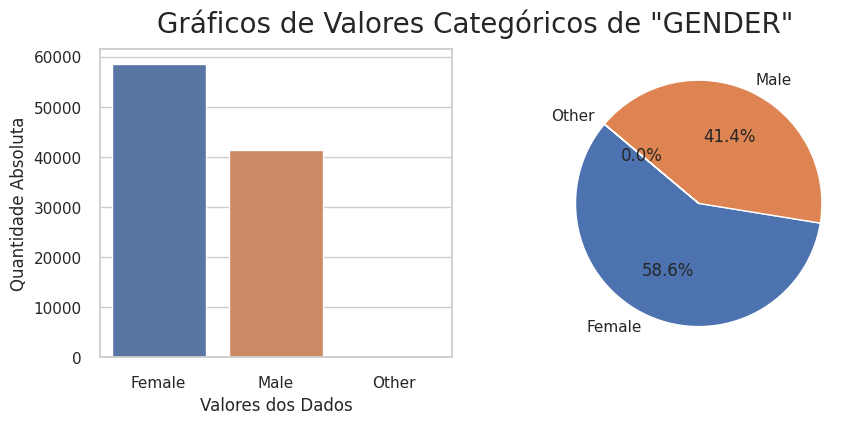

In [114]:
x, y = np.unique(df['gender'], return_counts=True)
graficos_barras_pizza(x,y, 'gender')

Percebemos que a variável categórica 'gender' apresenta 3 valores, sendo que um deles com apenas 18 ocorrências em 100.000 registros. Essa informação pode ser necessária na repartição de dados de treino e de teste, uma vez que o conjunto de dados pode receber todos os registros de 'gender' tipo 'Other', enquanto o outro, nenhum.

#### Variável 'smoking_history'

A distribuição da variável 'smoking_history' pode ser vista da seguinte forma:

		<Valores únicos>: <quantidade de ocorrências>
		-'No Info': 35816
		-'current': 9286
		-'ever': 4004
		-'former': 9352
		-'never': 35095
		-'not current': 6447


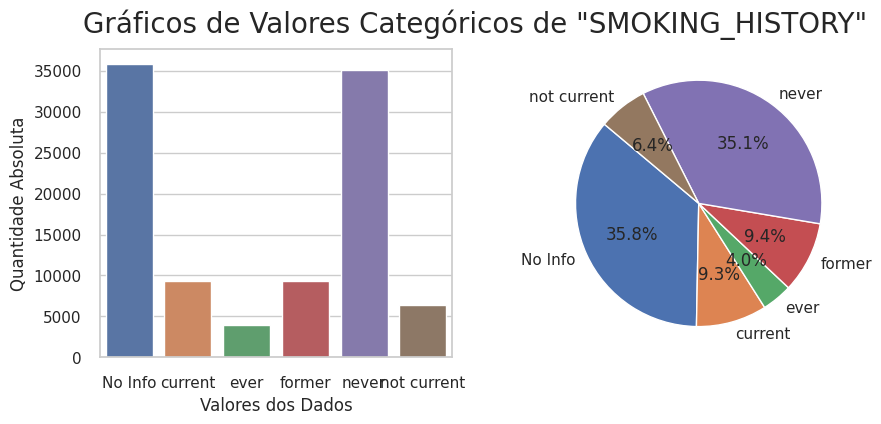

In [115]:
x, y = np.unique(df['smoking_history'], return_counts=True)
graficos_barras_pizza(x,y,'smoking_history')

Analisando os valores da variável, percebemos que existe um desbalanceamento dos dados, uma vez que os valores 'No info' e 'never' predominam sobre os demais. Porém, a princípio, não trazem prejuízos.

### Variáveis Numéricas

Uma vez avaliadas as variáveis categóricas, podemos fazer uma análise das variáveis numéricas. Nesse contexto, iremos observar dados estatísticos (média, desvio padrão, valores mínimo e máximo, bem como distribuição de quartis). Em seguida, observaremos as métricas das escalas, bem como a presença e a qualidade de outliers.

#### Análise Geral

In [116]:
# Estatísticas dos dados numéricos
df[numeric].describe().T

,count,mean,std,min,25%,50%,75%,max
age,100000.000,41.886,22.517,0.080,24.000,43.000,60.000,80.000
hypertension,100000.000,0.075,0.263,0.000,0.000,0.000,0.000,1.000
heart_disease,100000.000,0.039,0.195,0.000,0.000,0.000,0.000,1.000
bmi,100000.000,27.321,6.637,10.010,23.630,27.320,29.580,95.690
HbA1c_level,100000.000,5.528,1.071,3.500,4.800,5.800,6.200,9.000
blood_glucose_level,100000.000,138.058,40.708,80.000,100.000,140.000,159.000,300.000
diabetes,100000.000,0.085,0.279,0.000,0.000,0.000,0.000,1.000


Com base nos dados acima, percebemos que uma parte das colunas são `dados binários` e outra parte possuem `valores numéricos variados`, ressaltando-se ainda que os `limites máximo e mínimo não exibem valores espúrios`. 

#### Análise das Variáveis Binárias

Analisando os `dados binários`, temos os seguintes resultados:

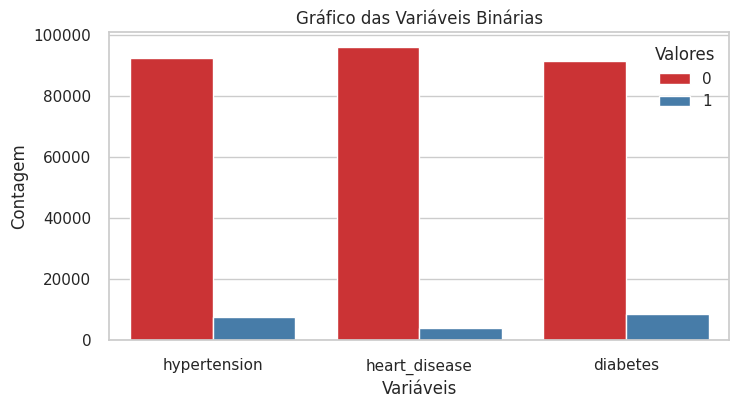

In [117]:
variables = ['hypertension', 'heart_disease', 'diabetes']
df_melted = df[variables].melt(var_name='Variaveis', value_name='Valores')
plt.figure(figsize=(8, 4))
sns.set(style='whitegrid')
sns.countplot(data=df_melted, x='Variaveis', hue='Valores', palette='Set1')
plt.xlabel('Variáveis')
plt.ylabel('Contagem')
plt.title('Gráfico das Variáveis Binárias')
plt.show()

Assim, percebemos que os dados estão `completamente desbalanceados`, sendo certo que podemos classificar essa situação como um problema, especialmente com a variável 'diabetes' (variável target). Isto é, a distribuição desequilibrada da variável target poderá gerar viéses e prejudicar a qualidade do resultado final da classificação - por exemplo, deixando de identificar pessoas diabéticas, o que, reflexamente, aumenta a quantidade de pessoas não-diabéticas. Por isso, deveremos `selecionar uma amostragem mais equilibrada ao treinar o modelo`. Esse método deverá mitigar o problema, bem irá produzir um modelo mais genérico e eficiente (capaz de se adaptar melhor a conjuntos de dados diferentes).

#### Análise das Variáveis Númericas (Inteiras e Contínuas)

Por outro lado, temos as `variáveis numéricas`. Com base em seus valores, podemos avaliar suas escalas e seus quartis.

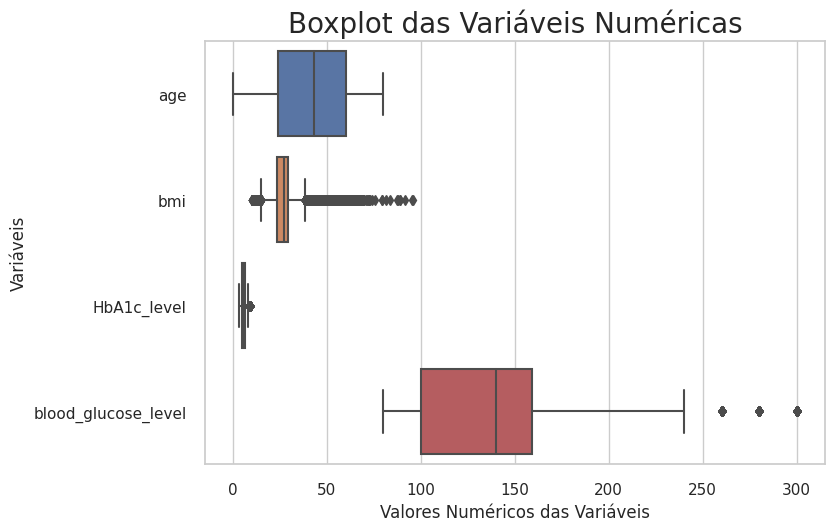

In [118]:
sns.boxplot(data=df[['age', 'bmi', 'HbA1c_level', 'blood_glucose_level']], orient='h')
plt.xlabel('Valores Numéricos das Variáveis')
plt.ylabel('Variáveis')
plt.title('Boxplot das Variáveis Numéricas', fontsize=20)
plt.show()

Percebemos por meio dos boxplots dois fatos importantes:

* `Escalas diferentes`: essa característica demanda tratamento de dados para escalonar os valores em uma mesma escala, visando evitar vieses em algoritmos de distância (tipo kNN).

* `Presença de Outliers`: os boxplots indicam a presença de outliers. Esse fato merece atenção, pois usaremos algoritmos que podem sofrer influências negativas de outliers. Por isso, passaremos a olhar o tema com mais cuidado.

#### Análise de Outliers

Haja vista que os boxplots indicaram a presença de outliers, será necessário `conhecer melhor a quantidade e a natureza dos dados` que apresentam valores fora dos limites dos dados, bem como os seus `impactos sobre os dados`. Nesse caso, iremos percorrer uma análise em dois passos:

* Primeiro passo: iremos fazer uma `análise númerica dos limites` considerados em Ciência de Dados, bem como iremos selecionar os valores identificados como `outliers em uma lista`. 
* Segundo passo: iremos criar `boxplots individualizados`, os quais irão exprimir a `quantidade de outliers contabilizados` (valores numéricos) e os `limites calculados` (barras verticais vermelhas).

Assim, teremos uma visão mais abrangente e realística do cenário observado.

				OUTLIERS DA COLUNA 'AGE'
Limite Inferior: -30.000 
Limite Superior: 114.000
Outliers da coluna 'age': []


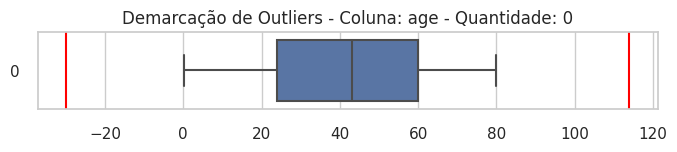



				OUTLIERS DA COLUNA 'BMI'
Limite Inferior: 14.705 
Limite Superior: 38.505
Outliers da coluna 'bmi': [54.7, 13.99, 56.43, 63.48, 55.61, 50.13, 44.06, 14.43, 41.24, 39.36, 40.9, 42.24, 13.79, 13.57, 12.15, 39.3, 14.69, 39.46, 43.14, 50.3, 44.0, 39.29, 48.02, 51.76, 14.35, 38.64, 40.31, 45.99, 40.02, 43.42, 14.0, 46.12, 41.01, 40.59, 69.37, 39.17, 41.65, 43.79, 48.2, 60.26, 39.46, 40.86, 44.38, 42.57, 43.41, 10.3, 42.4, 49.27, 39.0, 42.0, 49.23, 42.54, 14.7, 11.16, 44.5, 40.0, 42.48, 39.9, 13.95, 40.37, 54.12, 46.07, 44.23, 38.95, 14.31, 39.45, 41.76, 40.81, 13.12, 11.85, 49.0, 10.77, 43.16, 41.14, 43.75, 40.5, 42.44, 38.81, 57.17, 45.7, 40.01, 45.03, 39.2, 44.24, 48.61, 40.39, 40.77, 50.36, 38.75, 38.66, 13.02, 14.69, 40.67, 13.66, 40.21, 38.91, 60.2, 43.81, 40.0, 48.57, 38.97, 13.91, 40.31, 45.19, 14.18, 41.16, 41.9, 40.96, 42.12, 41.45, 42.64, 40.1, 41.64, 42.15, 41.65, 42.62, 40.59, 39.28, 44.16, 46.32, 54.87, 51.61, 44.2, 42.49, 43.15, 42.13, 39.69, 13.67, 43.29, 44.62, 14.5, 4

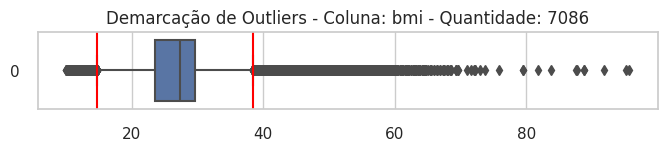



				OUTLIERS DA COLUNA 'HBA1C_LEVEL'
Limite Inferior: 2.700 
Limite Superior: 8.300
Outliers da coluna 'HbA1c_level': [9.0, 9.0, 8.8, 9.0, 9.0, 9.0, 9.0, 8.8, 8.8, 9.0, 9.0, 8.8, 8.8, 9.0, 8.8, 9.0, 8.8, 8.8, 8.8, 9.0, 9.0, 9.0, 8.8, 9.0, 8.8, 8.8, 8.8, 9.0, 9.0, 8.8, 8.8, 8.8, 9.0, 8.8, 9.0, 8.8, 9.0, 9.0, 8.8, 9.0, 9.0, 8.8, 8.8, 9.0, 8.8, 8.8, 9.0, 8.8, 8.8, 8.8, 9.0, 8.8, 9.0, 9.0, 9.0, 9.0, 8.8, 9.0, 9.0, 8.8, 9.0, 8.8, 9.0, 8.8, 9.0, 9.0, 9.0, 8.8, 8.8, 8.8, 8.8, 8.8, 8.8, 9.0, 8.8, 8.8, 9.0, 9.0, 9.0, 8.8, 9.0, 9.0, 9.0, 8.8, 9.0, 8.8, 9.0, 9.0, 8.8, 9.0, 8.8, 8.8, 9.0, 8.8, 9.0, 9.0, 9.0, 8.8, 9.0, 9.0, 8.8, 9.0, 9.0, 9.0, 8.8, 8.8, 9.0, 8.8, 8.8, 8.8, 9.0, 8.8, 8.8, 8.8, 9.0, 9.0, 9.0, 9.0, 9.0, 8.8, 8.8, 8.8, 9.0, 9.0, 9.0, 8.8, 9.0, 8.8, 8.8, 9.0, 9.0, 9.0, 9.0, 9.0, 8.8, 8.8, 8.8, 8.8, 9.0, 8.8, 9.0, 9.0, 8.8, 8.8, 9.0, 9.0, 8.8, 8.8, 8.8, 9.0, 8.8, 8.8, 8.8, 9.0, 8.8, 8.8, 9.0, 9.0, 9.0, 9.0, 9.0, 8.8, 9.0, 9.0, 8.8, 9.0, 8.8, 9.0, 9.0, 9.0, 8.8, 8.8, 9.0, 9.0, 9.0, 8.8,

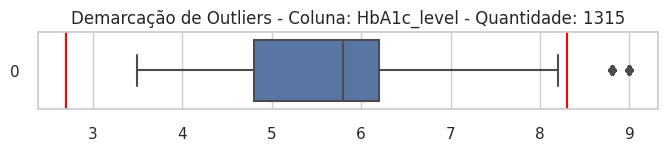



				OUTLIERS DA COLUNA 'BLOOD_GLUCOSE_LEVEL'
Limite Inferior: 11.500 
Limite Superior: 247.500
Outliers da coluna 'blood_glucose_level': [260, 300, 280, 280, 300, 280, 300, 280, 260, 280, 260, 260, 300, 300, 280, 280, 300, 300, 300, 280, 260, 300, 300, 260, 260, 300, 300, 280, 260, 280, 280, 260, 300, 280, 260, 260, 300, 280, 280, 260, 300, 280, 300, 260, 300, 300, 260, 260, 280, 300, 300, 260, 260, 300, 300, 280, 280, 280, 280, 300, 280, 300, 280, 260, 300, 260, 260, 300, 280, 280, 260, 260, 300, 260, 300, 280, 260, 300, 280, 280, 300, 260, 280, 280, 280, 300, 260, 300, 280, 300, 300, 260, 280, 260, 300, 280, 280, 280, 280, 260, 300, 280, 260, 260, 260, 280, 260, 300, 280, 280, 300, 280, 280, 280, 260, 280, 260, 280, 300, 300, 280, 280, 260, 300, 260, 260, 280, 300, 300, 280, 280, 260, 260, 300, 300, 300, 280, 260, 300, 280, 260, 300, 300, 300, 260, 260, 300, 280, 300, 280, 260, 260, 300, 280, 260, 300, 300, 280, 280, 280, 280, 300, 280, 260, 300, 280, 300, 300, 260, 260, 300, 260, 

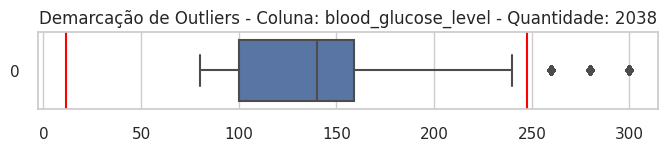

In [119]:
# Identificando Outliers
outliers = {}
for column in ['age', 'bmi', 'HbA1c_level', 'blood_glucose_level']:
    distribution = df[column].tolist()
    distribution = sorted(distribution)
    Q1 = np.percentile(distribution, 25)
    Q3 = np.percentile(distribution, 75)
    IQR = np.abs(Q3 - Q1)
    superior = Q3 + 1.5*IQR
    inferior = Q1 - 1.5*IQR
    outliers[column] = df[column].loc[(df[column] > superior) | (df[column] < inferior)].tolist()

    print(f"\t\t\t\tOUTLIERS DA COLUNA '{column.upper()}'")
    print(f"Limite Inferior: {inferior:.3f} \nLimite Superior: {superior:.3f}")
    print(f"Outliers da coluna '{column}': {outliers[column]}")
    plt.figure(figsize=(8, 1))
    sns.boxplot(distribution, orient='h');
    plt.axvline(inferior, color='red')
    plt.axvline(superior, color='red')
    plt.title(f'Demarcação de Outliers - Coluna: {column} - Quantidade: {len(outliers[column])}')
    plt.show()
    print('\n')


Assim, com base nas análises realizadas acima, percebemos que, embora tenhamos identificado milhares de valores como outliers das colunas 'bmi', 'blood_glucose_level' e 'HbA1c_level', `é crucial notar que não se tratam verdadeiramente de outliers`, uma vez que existem `numerosos valores fora dos limites superior ou inferior`. Por isso, entendemos que esses dados devem ser interpretados como uma continuação dos dados existentes, o que, reflexamente, permite concluir que sua presença `não compromete a integridade das análises`.

### Correlações

Em determinadas classificações, pode ocorrer de uma única característica ser suficiente para balizar a classificação da variável alvo. Da mesma forma, pode acontecer de várias variáveis estarem explicando as mesmas informações. Por isso, é conveniente verificar as correlações existentes entre as variáveis do banco de dados. Por isso, iremos realizar uma `Análise Visual das Correlações`, bem como uma análise númerica por meio das `Correlações de Pearson e de Spearman`.

#### Tranformação dos Dados Categóricos em Numéricos

Em primeiro lugar, é preciso destacar que não é possível realizar as análises de correlação com dados categóricos, por isso iremos tranformá-los em dados numéricos.

In [120]:
# Criando objetos de transformação
encoder_gender = LabelEncoder()
encoder_smoking = LabelEncoder()

# Aplicando transformações
df['gender'] = encoder_gender.fit_transform(df['gender'])
df['smoking_history'] = encoder_smoking.fit_transform(df['smoking_history'])

# Exibindo dados transformados
df.head(5)

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,0,80.000,0,1,4,25.190,6.600,140,0
1,0,54.000,0,0,0,27.320,6.600,80,0
2,1,28.000,0,0,4,27.320,5.700,158,0
3,0,36.000,0,0,1,23.450,5.000,155,0
4,1,76.000,1,1,1,20.140,4.800,155,0


#### Análise Visual das Correlações

A primeira análise que deveremos realizar é `buscar correlações do tipo lineares ou do tipo gaussianas`. Elas trazem a possibilidade de explicar as variáveis alvo de forma simplificada. Por isso, iremos realizar `distribuições conjuntas de todas as variáveis do banco de dados` e, por meio de uma análise visual, poderemos tentar identificar padrões.

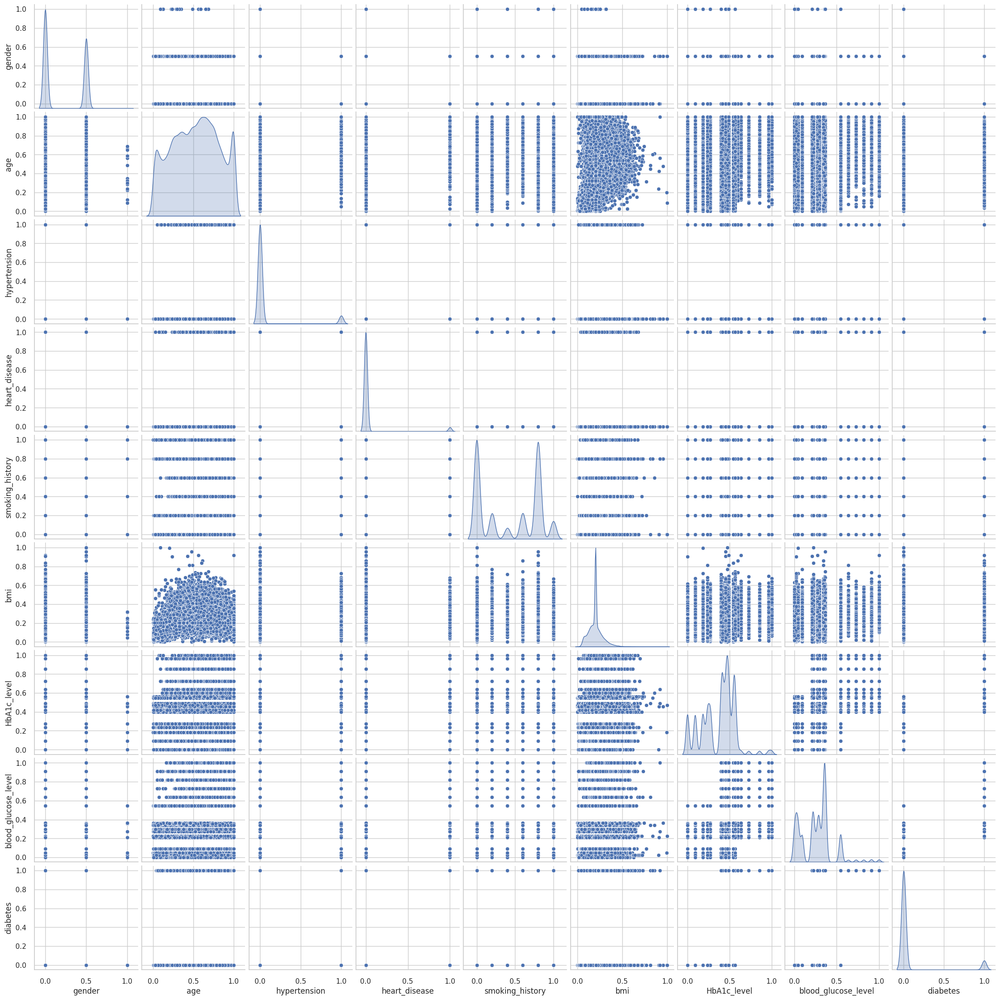

In [121]:
# Plotando Gráfico de Distribuições Conjuntas
df_correlation = pd.DataFrame(MinMaxScaler().fit_transform(df), columns=df.columns)
sns.pairplot(df_correlation, diag_kind='kde');

De acordo com os dados, `nenhuma distribuição conjunta apresenta correlação linear ou distribuição normal`. Por isso, as expectativas de correlação são baixas.

#### Correlação de Pearson

A correlação de Pearson é utilizada para analisar a `correlação de duas variáveis` e não significa uma relação causalidade, isto é, não implica a relação de causa e consequência. A medida varia no intervalo [-1,1], sendo certo que o fato de ser positiva ou negativa significa a forma como a correlação se manifesta (crescente ou decrescente), enquanto que os valores numéricos mostram a força da correlação, sendo 0 (zero) o valor de ausência de correlação e o valor 1 (um) como a correlação perfeita. Nesse contexto, podemos categorizar os dados intermediários da seguinte forma:

* 0.0-0.2: muito fraca.
* 0.2-0.4: fraca
* 0.4-0.6: moderada
* 0.6-0.8: forte
* 0.8-1.0: muito forte

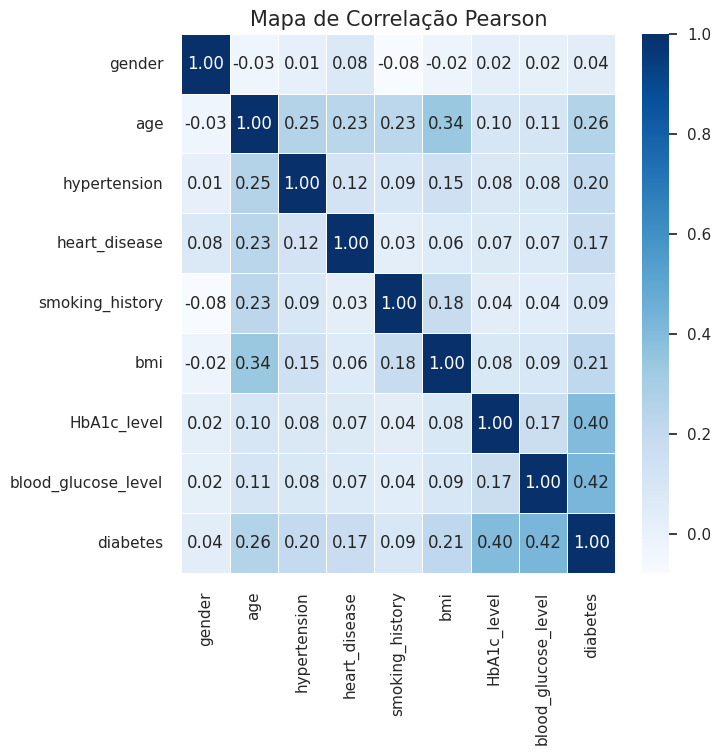

In [122]:
pearson = df.corr()
plt.figure(figsize = (7,7))
sns.heatmap(pearson, annot = True, fmt=".2f", linewidth=.6, cmap = "Blues")
plt.title("Mapa de Correlação Pearson", fontsize=15)
plt.show()

#### Correlação de Spearman

A interpretação da correlação Spearman leva em consideração o valor gerado no intervalo [-1,1]. Da mesma forma que a correlação de Pearson, quanto mais próximo dos extremos, mais correlação apresenta, mas, se próximo de zero, implica correlações fracas ou inexistentes. Em termos de intensidade, porém, existe divergência de entendimento, mas predomina a seguinte métrica:

* 0.0-0.3: correlação fraca.
* 0.3-0.5: correlação moderada.
* 0.5-1.0: correação forte.

Por fim, é de se acrescentar que a diferença da correlação de Spearman e Pearson é que podemos usar a primeira para dados que não possuem relações lineares, bem como que ela é menos suscetível a outliers.

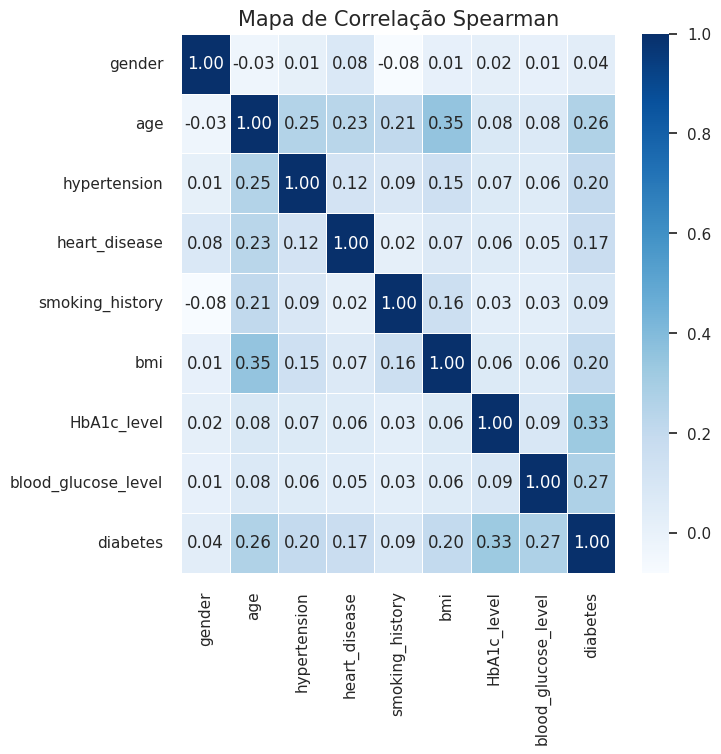

In [123]:
spearman = df.corr('spearman')
plt.figure(figsize = (7,7))
sns.heatmap(spearman, annot = True, fmt=".2f", linewidth=.6, cmap = "Blues")
plt.title("Mapa de Correlação Spearman", fontsize=15)
plt.show()

#### Análise dos Resultados das Correlações

De modo geral, `os coeficientes de correlação mostraram valores que podem ser interpretados como sendo de baixa correlação`. Por isso, não existem indicadores que, a priori, sirvam para fazer correlações robustas. Por exemplo:

* As correlações de Pearson mostram relações lineares moderadas entre a variável target 'diabetes' e as variáveis 'HbA1c_level' (0.40) e 'blood_glucose_level' (0.42). Mas, todas as demais correlações são fracas.

* As correlações de Spearman mostram baixa correlação geral entre 'diabetes' e outras variáveis, sendo certo que exibe como correlações moderadas apenas o cruzamento entre 'bmi' e 'age' (0.35), bem como 'diabetes' e a variável 'HbA1c_level' (0.33).

### Redução de Dimensionalidade com t-SNE para Verificar Possibilidade de Classificação

Além de toda a análise explorátória realizada acima, podemos também utilizar a redução de dimensionalidade para verificar se a classificação poderá ser realizada com qualidade.

In [124]:
# Redução de dimensionalidade
tsne = TSNE(n_components=2)
tsne_result = tsne.fit_transform(df.drop('diabetes', axis=1))
tsne_result

array([[   5.7115326,  -97.78038  ],
       [-124.314476 ,  -38.506035 ],
       [  39.82521  ,   49.563538 ],
       ...,
       [  79.549805 ,  -55.4194   ],
       [ -64.00254  ,   14.52664  ],
       [ -60.358963 ,  -53.499462 ]], dtype=float32)

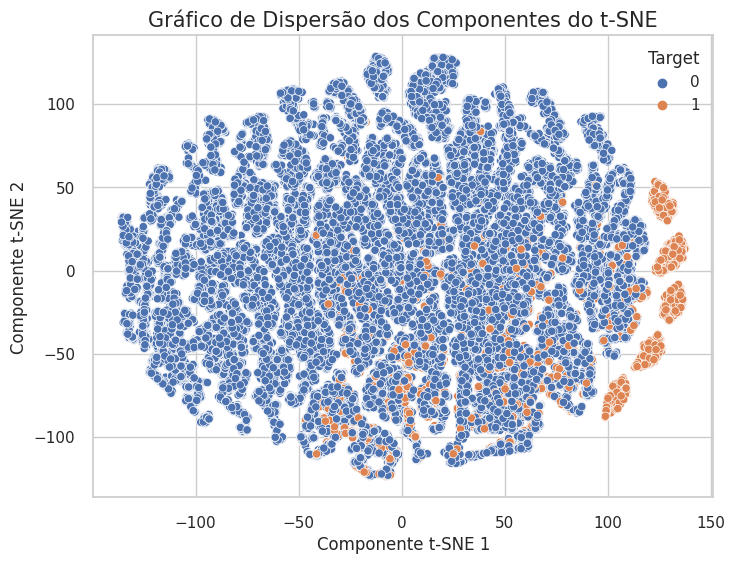

In [125]:
tsne_x = tsne_result[:, 0] # Eixo X
tsne_y = tsne_result[:, 1] # Eixo Y
target = df['diabetes'].tolist() # Alvo

df_tsne = pd.DataFrame({'Componente t-SNE 1': tsne_x, 'Componente t-SNE 2': tsne_y, 'Target': target})
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_tsne, x=tsne_x, y=tsne_y, hue='Target')
plt.xlabel('Componente t-SNE 1')
plt.ylabel('Componente t-SNE 2')
plt.title('Gráfico de Dispersão dos Componentes do t-SNE', fontsize=15)
plt.legend(title='Target')
plt.show()

Com base no gráfico acima, percebemos que `existe boa chance de realizar a classificação`. Contudo, não será perfeita, apesar de a expectativa contar com elevadas taxas de performance.

## Pré-Processamento dos Dados

### Carregar Dados

Para evitar interferências de eventuais alterações realizadas anteriormente, iremos recarregar os dados novamente.

In [126]:
df = pd.read_csv(path)
df.head(5)

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,Female,80.000,0,1,never,25.190,6.600,140,0
1,Female,54.000,0,0,No Info,27.320,6.600,80,0
2,Male,28.000,0,0,never,27.320,5.700,158,0
3,Female,36.000,0,0,current,23.450,5.000,155,0
4,Male,76.000,1,1,current,20.140,4.800,155,0


### Divisão dos Dados: Treino e Teste

Diante da identificação de desequilíbrios significativos no conjunto de dados (Análise Explorátoria), `planejamos reduzir o conjunto de dados de forma controlada para selecionar e treinar o modelo de classificação`. Essa ação se torna essencial para `evitar resultados enviesados`. 

In [127]:
# Seleção de dados cujos pacientes não são diabéticos
df_class0 = df[df['diabetes'] == 0]
df_class0.head(5)

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,Female,80.000,0,1,never,25.190,6.600,140,0
1,Female,54.000,0,0,No Info,27.320,6.600,80,0
2,Male,28.000,0,0,never,27.320,5.700,158,0
3,Female,36.000,0,0,current,23.450,5.000,155,0
4,Male,76.000,1,1,current,20.140,4.800,155,0


In [128]:
# Seleção de dados cujos pacientes são diabéticos
df_class1 = df[df['diabetes'] == 1]
df_class1.head(5)

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
6,Female,44.000,0,0,never,19.310,6.500,200,1
26,Male,67.000,0,1,not current,27.320,6.500,200,1
38,Male,50.000,1,0,current,27.320,5.700,260,1
40,Male,73.000,0,0,former,25.910,9.000,160,1
53,Female,53.000,0,0,former,27.320,7.000,159,1


In [129]:
# Seleção de 7000 amostras aleatórias de pacientes não diabéticos
df_class0_sampled = df_class0.sample(n=7000, random_state=42)

# Seleção de 3000 amostras aleatórias de pacientes diabéticos
df_class1_sampled = df_class1.sample(n=3000, random_state=42)

# Concatenação das 10000 amostragens em um dataset
df = pd.concat([df_class0_sampled, df_class1_sampled])
df.head(5)

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
21737,Female,35.000,0,0,No Info,27.320,3.500,200,0
62807,Male,66.000,0,0,No Info,27.320,4.500,145,0
38693,Male,32.000,0,0,never,32.710,6.600,90,0
72875,Male,46.000,0,0,No Info,32.780,4.000,80,0
14817,Female,22.000,0,0,never,23.510,4.500,158,0


Agora que realizamos a redução do dataset para `valores mais equilibrados (7000 não diabéticos e 3000 diabéticos)`, podemos seguir com a `divisão em dados de treino e dados de testes (holdout: 20% teste e 80% treino)`. Além disso, utilizaremos a `estratificação dos dados para garantir que teremos a mesma proporção de variáveis target nos dois conjuntos`.

In [130]:
# Divisão dos dados em dados de treino e de teste
x, y = df.drop('diabetes', axis=1), df['diabetes']

# Holdout em 20% testes e 80% treinamento (estratificação na variável target)
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, stratify=y, shuffle=True, random_state=42)

print('(X train, Y train):', X_train.shape, y_train.shape)
print('(X test, Y test):  ', X_test.shape, y_test.shape)

(X train, Y train): (8000, 8) (8000,)
(X test, Y test):   (2000, 8) (2000,)


### Transformação dos Dados de Treino

Como visto acima, será necessário `transformar os dados categóricos em dados numéricos (utilizando o Label Encoder)` e `desmanchar eventuais relações de ordens (por meio do One Hot Encoding)`.

In [131]:
encoder_gender = LabelEncoder()
encoder_smoking = LabelEncoder()

X_train['gender'] = encoder_gender.fit_transform(X_train['gender'])
X_train['smoking_history'] = encoder_smoking.fit_transform(X_train['smoking_history'])

Como não há ordem nas variáveis categóricas, iremos usar o método One Hot Encoding, usando a técnica do método get_dummies.

In [132]:
df_dummies = pd.get_dummies(X_train, columns=['gender', 'smoking_history'])
df_dummies.reset_index(drop=True, inplace=True)
print(df_dummies.head(5))
df_dummies.shape

     age  hypertension  heart_disease    bmi  HbA1c_level  \
0 35.000             0              0 33.300        6.000   
1 70.000             0              0 26.350        6.000   
2 80.000             0              0 31.010        9.000   
3 35.000             0              0 27.320        5.800   
4 24.000             0              0 27.320        3.500   

   blood_glucose_level  gender_0  gender_1  gender_2  smoking_history_0  \
0                  130      True     False     False              False   
1                   90     False      True     False              False   
2                  200     False      True     False              False   
3                  280     False      True     False               True   
4                   80     False      True     False               True   

   smoking_history_1  smoking_history_2  smoking_history_3  smoking_history_4  \
0              False              False              False               True   
1              False

(8000, 15)

### Tranformações nos Dados de Testes

Repetiremos o procedimento acima para os dados de testes, cuidando sempre para não deixar os dados serem viciados pela utilização de mesmos objetos.

In [133]:
encoder_gender_test = LabelEncoder()
encoder_smoking_test = LabelEncoder()

X_test['gender'] = encoder_gender_test.fit_transform(X_test['gender'])
X_test['smoking_history'] = encoder_smoking_test.fit_transform(X_test['smoking_history'])

In [134]:
df_dummies_test = pd.get_dummies(X_test, columns=['gender', 'smoking_history'])

print(df_dummies_test.head(5))
df_dummies_test.shape

         age  hypertension  heart_disease    bmi  HbA1c_level  \
59135 49.000             0              0 25.110        3.500   
66496 77.000             0              0 27.320        4.000   
29822 36.000             0              0 27.320        6.500   
80745  9.000             0              0 27.320        4.800   
69850 48.000             0              0 33.910        5.000   

       blood_glucose_level  gender_0  gender_1  gender_2  smoking_history_0  \
59135                  200      True     False     False              False   
66496                  100     False      True     False               True   
29822                  155     False      True     False               True   
80745                  130      True     False     False               True   
69850                  140     False      True     False              False   

       smoking_history_1  smoking_history_2  smoking_history_3  \
59135              False              False              False   
66

(2000, 15)

### Correção de Eventual Diferença

Essa etapa pode ou não ser necessária, pois nem sempre os registros de 'gender' dos testes serão contemplados com o valor 'Other'. Por isso, o conjunto de testes pode ficar com uma coluna a menos.

In [135]:
df_dummies.shape[1], df_dummies_test.shape[1]

(15, 15)

In [136]:
if df_dummies.shape[1] != df_dummies_test.shape[1]:
    df_dummies_test['gender_2'] = False

In [137]:
df_dummies.shape[1], df_dummies_test.shape[1]

(15, 15)

### Scaling

Inicialmente, a ideia era cuidar de eventuais vieses produzidos pelos outliers das variáveis ou minimizar eventuais efeitos deles na classificação. Por isso, foram testados os seguintes métodos de scaling:

* StandardScaling
* MinMaxScaler
* QuantileTranformer
* RobustScaler
* Logaritmo Natural

Enfatize-se que se escolheu os três últimos algoritmos com a finalidade exclusiva de evitar vieses de outliers. Porém, essas escolhas produziram problemas insolúveis, pois esses algoritmos geravam valores negativos ou infinitos, o que refletia em erros variados.

Além disso, comparando-se índices de classificação, tais como Accuracy, Recall, Precision, F1_Score, Mathews(MCC), ROC_AUC, FBeta, HammingLoss e Jaccard, foi avaliado que os métodos do StandardScaler e do MinMaxScaler obtiveram os melhores resultados, embora o StandardScaler não tenha funcionado com todos os algoritmos (vide, por exemplo, NaiveBayes, que exige valores positivos). 

Vale acrescentar que os resultados do Standard Scaler e do MinMaxScaler foram mais eficientes mesmo quando na presença dos scalers de minimização dos impactos dos outliers (QuantileTransformer, RobustScaler e Logaritmo Natural). 

`Por todas essas razões, a preocupação com os outliers se mostrou desnecessária, bem como que, por conveniência de automatização do código, adotou-se apenas o MinMaxScaler.`

In [138]:
X_train = MinMaxScaler().fit_transform(df_dummies)
X_test = MinMaxScaler().fit_transform(df_dummies_test)

In [139]:
print('(X train, Y train):', X_train.shape, X_test.shape)
print('(X test, Y test):', y_train.shape, y_test.shape)

(X train, Y train): (8000, 15) (2000, 15)
(X test, Y test): (8000,) (2000,)


## Testes dos Modelos: Clássicos e de Clustering

A seleção do melhor modelo está relacionada com duas características principais: 

* `Seleção do melhor algoritmo de Machine Learning para realizar a classificação das pessoas diabéticas`, utilizando as características previamente preprocessadas.

* `Seleção das melhores configurações de hiperparâmetros, visando elevar as métricas de avaliações, tais como a Acurácia, a Precision, a Recall e e F1-Score`.

Por outro lado, este procedimento de seleção precisa cuidar para que `não haja overfitting (memorização dos dados) nem underfitting (aprendizado deficiente)`. 

Em virtude dessas exigências, utilizamos o método disponibilizado pelo `GridSearchCV`, que, combinado com o `K-Fold`, permite explorar os dados de treinamento por meio do `sistema de rotação e validação`. Assim, os dados de treinamento serão repartidos em 5 conjuntos, sendo certo que 4 (quatro) deles serão de treinamento e o último reservado validação. Posteriormente, esses conjuntos de dados serão rotacionados, permitindo um treinamento mais eficiente. 

Além disso, `testaremos variadas combinações de hiperparâmetros` visando extrair aquela que melhor proporcione métricas de avaliação.

Por fim, cumpre mencionar que iremos coletar os seguintes resultados de avaliação: Acurácia, Precision, Recall e F1-Score. Como desejamos minimizar o erros do Tipo I (rejeitar casos de diabetes quando eram diabéticos) e do Tipo II (reconhecer casos de diabéticos quando não eram diabéticos), iremos utilizar a métrica de F1-Score, a qual é calculada como média harmônica da Precision e Recall. Por fim, vale acrescentar que não se utilizou da Acurácia para avaliação dos dados, pois, como se observou na análise exploratória, havia um grande desbalanceamento nos dados, o que pode influenciar negativamente os resultados da acurácia.

### Algoritmos Clássicos

In [140]:
# Configuração do K-Fold para evitar Overfitting ou Underfitting
kf = KFold(n_splits=5, shuffle=True)

# Configurando métricas de avaliação
scoring = {
    "AUC": make_scorer(roc_auc_score),
    "Accuracy": make_scorer(accuracy_score),
    "Precision": make_scorer(precision_score),
    'Recall': make_scorer(recall_score),
    'F1Score': make_scorer(f1_score)
}

# Configurando Algoritmos e seus hiperparâmetros
algorithms = [
    {
        'classificador': 'Logistic Regression',
        'model': LogisticRegression(),
        'param_grid': {
            'penalty': ['l1', 'l2'],
            'solver': ['liblinear', 'saga'],
            'class_weight': [None, 'balanced'],
            'tol': [1e-4, 1e-3, 1e-2],
            'warm_start': [True, False],
        }
    },
    {
        'classificador': 'Naive Bayes',
        'model': MultinomialNB(),
        'param_grid': {
            'fit_prior': [True, False],
            'class_prior': [None, [0.3, 0.7], [0.7, 0.3], [0.5, 0.5]]
        }
    },
    {
        'classificador': 'K-Nearest Neighbors',
        'model': KNeighborsClassifier(),
        'param_grid': {
            'n_neighbors': [x for x in range(1,15)],
            'metric': ['euclidean', 'manhattan'],
            'weights': ['uniform', 'distance'],
            'algorithm': ['auto', 'kd_tree', 'ball_tree'],
            'n_jobs': [-1]
        }
    },
    {
        'classificador': 'Support Vector Classification',
        'model': SVC(),
        'param_grid': {
            'kernel':['linear', 'rbf', 'sigmoid'],
            'probability': [True, False],
            'shrinking': [True, False],
            'class_weight': [None, 'balanced']
        }
    },
    {
        'classificador': 'Ridge Classifier',
        'model': RidgeClassifier(),
        'param_grid': {
            'solver':['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
        }
    },
    {
        'classificador': 'ExtraTreeClass',
        'model': ExtraTreesClassifier(),
        'param_grid': {
            'n_estimators': [x for x in range(100, 1000, 100)],
            'criterion': ['gini', 'entropy', 'log_loss'],
        }
    },
    {
        'classificador': 'Random Forest',
        'model': RandomForestClassifier(),
        'param_grid': {
               'n_estimators': [x for x in range(100,1000, 100)],
               'criterion': ['gini', 'entropy', 'log_loss'],
        }
    },
    {
        'classificador': 'DecisionTree',
        'model': DecisionTreeClassifier(),
        'param_grid': {
            'criterion': ['gini', 'entropy', 'log_loss'],
            'splitter': ['best', 'random']
        }
    },
    {
        'classificador': 'Perceptron',
        'model': Perceptron(),
        'param_grid': {
           'warm_start':[True, False],
           'penalty': ['l1','l2', 'elasticnet', None],
           'n_jobs' : [-1]
        }
    },
    {
        'classificador': 'MLPClassifier',
        'model': MLPClassifier(),
        'param_grid': {
            'hidden_layer_sizes': [(x,) for x in range(50,250, 50)],
            'activation': ['relu', 'logistic', 'tanh'], 
            'max_iter': [1000],
            'batch_size': [200, 400]
        }
    },
]

In [141]:
# Iremos armazenar os dados de seleção para posterior avaliação.
predictions = pd.DataFrame()
df_results = pd.DataFrame(columns=['Classificador', 'Tempo Treino', 'AUC (Validação)', 'AUC (Treino)',
                                   'Accuracy (Validação)', 'Accuracy (Treino)', 'Precision (Validação)',
                                   'Precision (Treino)', 'Recall (Validação)', 'Recall (Treino)',
                                   'F1Score (Validação)', 'F1Score (Treino)', 'Accuracy (Teste)',
                                   'Precision (Teste)', 'Recall (Teste)', 'F1Score (Teste)', 'Parâmetros'])

# Testando modelos
for algorithm in algorithms:

    classificador = algorithm['classificador']
    model = algorithm['model']
    param_grid = algorithm['param_grid']

    grid_search = GridSearchCV(
        estimator = model,
        param_grid = param_grid,
        scoring = scoring,
        refit = "F1Score",
        n_jobs=-1,
        cv = kf,
        return_train_score=True
    )

    grid_search.fit(X_train, y_train)

    # Armazenando Resultados de Treinamento do Modelo
    line = df_results.shape[0]
    df_results.loc[line] = {
        'Classificador': classificador,
        'Tempo Treino': float(grid_search.cv_results_['mean_fit_time'][grid_search.best_index_]),
        'AUC (Validação)': float(grid_search.cv_results_['mean_test_AUC'][grid_search.best_index_]),
        'AUC (Treino)': float(grid_search.cv_results_['mean_train_AUC'][grid_search.best_index_]),
        'Accuracy (Validação)': float(grid_search.cv_results_['mean_test_Accuracy'][grid_search.best_index_]),
        'Accuracy (Treino)': float(grid_search.cv_results_['mean_train_Accuracy'][grid_search.best_index_]),
        'Precision (Validação)': float(grid_search.cv_results_['mean_test_Precision'][grid_search.best_index_]),
        'Precision (Treino)': float(grid_search.cv_results_['mean_train_Precision'][grid_search.best_index_]),
        'Recall (Validação)': float(grid_search.cv_results_['mean_test_Recall'][grid_search.best_index_]),
        'Recall (Treino)': float(grid_search.cv_results_['mean_train_Recall'][grid_search.best_index_]),
        'F1Score (Validação)': float(grid_search.cv_results_['mean_test_F1Score'][grid_search.best_index_]),
        'F1Score (Treino)': float(grid_search.cv_results_['mean_train_F1Score'][grid_search.best_index_]),
        'Parâmetros': grid_search.best_params_
    }

    # Testando os Modelos com melhores parâmetros
    best_model = grid_search.best_estimator_
    best_model.set_params(**grid_search.best_params_)
    best_model.fit(X_train, y_train)
    predictions[classificador] = best_model.predict(X_test)

    # Calculando e Armazenando Métricas
    a, p, r, f = calculate_metrics(classificador, y_test, predictions[classificador])
    df_results.iloc[line, 12] = a
    df_results.iloc[line, 13] = p
    df_results.iloc[line, 14] = r
    df_results.iloc[line, 15] = f

###############################################################################################################
                                      LOGISTIC REGRESSION
###############################################################################################################
Accuracy (Treino): 	 0.8992 	Accuracy (Validação): 	 0.8986 	Accuracy (Teste): 	 0.9070
Precision (Treino):	 0.8674 	Precision (Validação):	 0.8667 	Precision (Teste):	 0.8619
Recall  (Treino):  	 0.7839 	Recall  (Validação):  	 0.7825 	Recall  (Teste):  	 0.8217
F1-Score (Treino): 	 0.8236 	F1-Score (Validação):	 0.8223 	F1-Score (Teste): 	 0.8413
Parâmetros de Otimização: {'class_weight': None, 'penalty': 'l1', 'solver': 'saga', 'tol': 0.01, 'warm_start': False}

Observação: os valores de treino e de validação são valores médios originados no GridSearchCV.


###############################################################################################################
                                      N

###############################################################################################################
                                      K-NEAREST NEIGHBORS
###############################################################################################################
Accuracy (Treino): 	 0.9995 	Accuracy (Validação): 	 0.8869 	Accuracy (Teste): 	 0.8945
Precision (Treino):	 1.0000 	Precision (Validação):	 0.8368 	Precision (Teste):	 0.8430
Recall  (Treino):  	 0.9983 	Recall  (Validação):  	 0.7737 	Recall  (Teste):  	 0.7967
F1-Score (Treino): 	 0.9992 	F1-Score (Validação):	 0.8040 	F1-Score (Teste): 	 0.8192
Parâmetros de Otimização: {'algorithm': 'auto', 'metric': 'manhattan', 'n_jobs': -1, 'n_neighbors': 6, 'weights': 'distance'}

Observação: os valores de treino e de validação são valores médios originados no GridSearchCV.


###############################################################################################################
                               

### Algoritmos de Clusterização

Embora a clusterização possa ser utilizada para realizar predições, sua principal utilização visa realizar agrupamento de dados que apresentem características semelhantes. Assim, `abordaremos esses algoritmos apenas para testar se podem ser úteis no reonhecimento de padrões nas características de pessoas diabéticas`.

#### Elbow Test

O `Elbow Test` é responsável por realizar uma análise dos dados e encontrar a quantidade de clusters que trariam a melhor classificação. Ele normalmente é utilizado junto do algoritmo K-Means. Assim, vejamos o que o teste nos mostra:

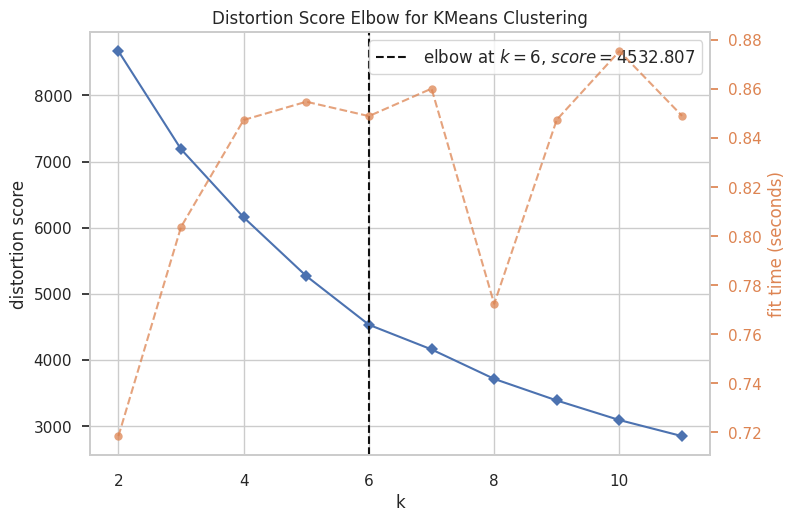

In [142]:
visualizer = KElbowVisualizer(KMeans(), k=(2,12))
visualizer.fit(X_train)
elbow_value = visualizer.elbow_value_
visualizer.show(); 

De acordo com o gráfico, percebemos que o algoritmo sugere que `a quantidade ideal de clusters para se dividir a amostra é de 6 unidades`. Nesse caso, a quantidade sugerida é superior àquela que desejamos encontrar, pois, almejamos obter apenas 2 (dois) grupos: diabéticos e não-diabéticos. Assim, visando atingir os objetivos do presente trabalho, `percebemos indícios de que a classificação não será de boa qualidade`, pois deveremos forçar a obtenção de apenas dois grupos (quando for possível).

#### Metricas de Avaliação

Para avaliação dos dados coletados de clusterização, observaremos as seguintes métricas:

* _Homogeneity_: essa métrica mede quão bem os clusters possuem apenas dados de uma mesma classe. Quanto mais próximo de 1, mais homogêneo é o agrupamento.

* _Completeness_: verifica se todos registros de uma mesma classe foram atribuídos a um mesmo cluster. Quanto mais próximo de 1 (um), melhor.

* _Mutual Info Score_: mede a quantidade de informação compartilhada entre os agrupamentos e as classes reais.

* _Adjusted Mutual Info Score_: mede a correspondência entre a classe do agrupamento e a classe real, ajustada a chance. Varia de 0 (sem relação) e 1 (perfeita correpondência).

* _Rand Score_: indica a semelhança entre pares de pontos de dados no agrupamento e nas classes reais. Varia de -1 (semelhança nula) a 1 (correspondência perfeita).

* _Adjusted Rand Score_: trata-se de uma versão ajustada do RandScore e leva em consideração a aleatoriedade. Varia de -1 (pior) a 1 (melhor).

* _Fowlkes Mallows Score_: calcula a raiz quadrada da precisão média e da sensibilidade média dos agrupamentos em relação às classes reais.

* _Calinski HaraBasz Score_: avalia a qualidade do cluster medidndo a variação entre os clusters e dentro deles. Quanto maior o valor, melhor a separação entre os clusters (1000 é relativamente alto).

* _Davies Bouldin Score_: avalia a compactação e a separação entre clusters. Quanto menor o valor (mais próximo de zero), melhor é a qualidade do agrupamento.

* _Silhoutte Scores_: trata-se de uma razão entre a distância média entre os pontos do cluster com a distância média aos pontos do cluster mais próximo. Varia de -1 a 1.

#### Testando Modelos

In [143]:
# Configurando automação dos testes
algorithms = [
    {
        'classificador': 'KMeans', 
        'model': KMeans(
            n_clusters=2, 
            n_init=30
        ),
    },
    {   
        'classificador': 'AgglomerativeClustering',
        'model': AgglomerativeClustering(
            n_clusters=2, 
            linkage='complete', 
            affinity='euclidean'
        ),
    },
    {   
        'classificador': 'DBSCAN',
        'model': DBSCAN(),
    }
]

###############################################################################################################
                                      KMEANS
###############################################################################################################

				ESTATISTICAS DE AVALIAÇÃO
- Homogeneity: 0.0046
- Completeness: 0.0041
- Mutual Info Score: 0.0028
- Adjusted Mutual Info Score: 0.0040
- Rand Score: 0.5071
- Adjusted Rand Score: 0.0115
- Fowlkes Mallows Score: 0.5482
- Calinski HaraBasz Score: 900.6728
- Davies Bouldin Score: 1.4497
- Silhoutte Scores: 0.3128



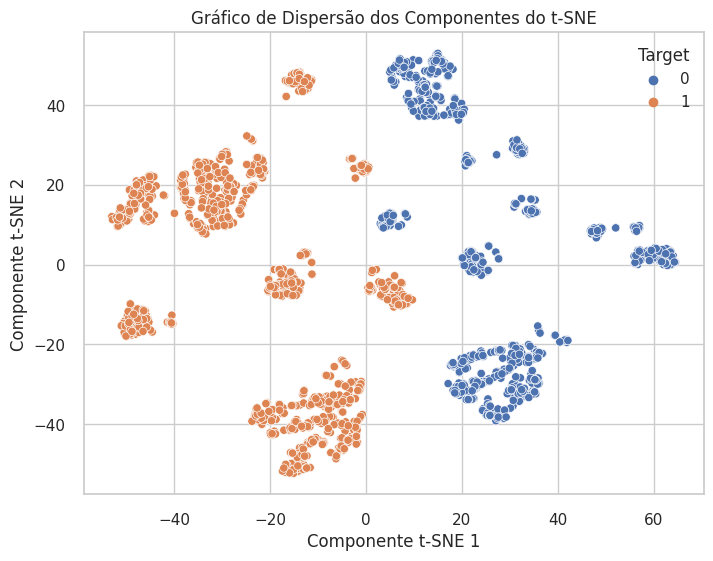

###############################################################################################################
                                      AGGLOMERATIVECLUSTERING
###############################################################################################################

				ESTATISTICAS DE AVALIAÇÃO
- Homogeneity: 0.0090
- Completeness: 0.0079
- Mutual Info Score: 0.0055
- Adjusted Mutual Info Score: 0.0080
- Rand Score: 0.5053
- Adjusted Rand Score: 0.0105
- Fowlkes Mallows Score: 0.5433
- Calinski HaraBasz Score: 711.4523
- Davies Bouldin Score: 1.6325
- Silhoutte Scores: 0.2733



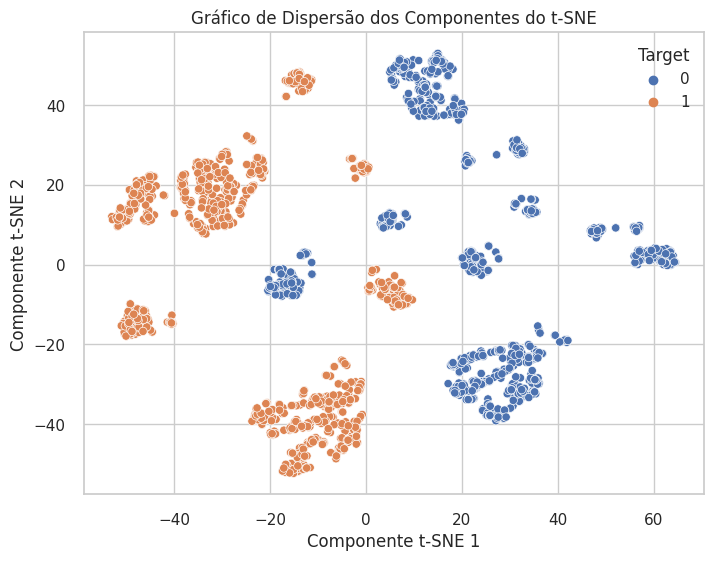

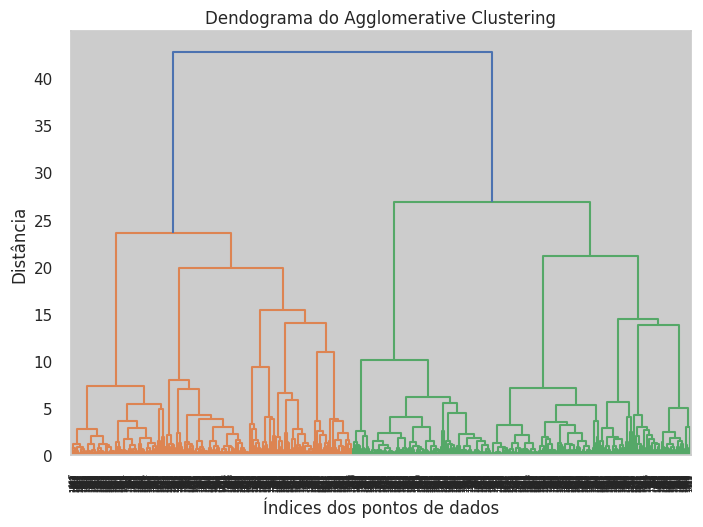

###############################################################################################################
                                      DBSCAN
###############################################################################################################

				ESTATISTICAS DE AVALIAÇÃO
- Homogeneity: 0.1513
- Completeness: 0.0348
- Mutual Info Score: 0.0924
- Adjusted Mutual Info Score: 0.0522
- Rand Score: 0.4591
- Adjusted Rand Score: 0.0397
- Fowlkes Mallows Score: 0.2906
- Calinski HaraBasz Score: 387.5888
- Davies Bouldin Score: 1.1855
- Silhoutte Scores: 0.5155



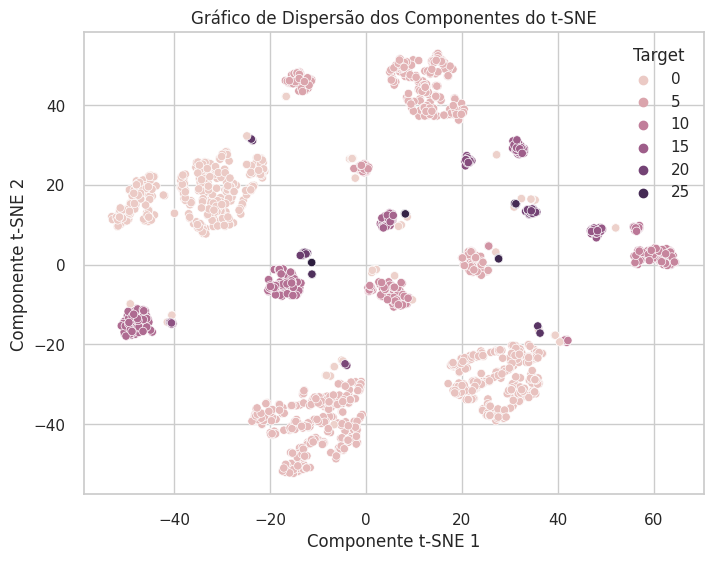

In [144]:
# Criando Dados com TSNE para exibir resultados de predições
tsne_test = TSNE(n_components=2).fit_transform(X_test)
x_grafico = tsne_test[:, 0]
y_grafico = tsne_test[:, 1]

# Executando Predições
for algorithm in algorithms:
    
    # Obtendo dados do algoritmo
    classificador = algorithm['classificador']
    model = algorithm['model']
    
    # Treinando e Classificação
    predictions[classificador] = model.fit_predict(X_test)
        
    # Calcula Métricas
    calculate_metrics_cluster(X_test, y_test, predictions[classificador], x_grafico, y_grafico, classificador)

    # Monta Dendograma do Agglomerative Clustering
    if classificador == 'AgglomerativeClustering':  
        linkage_matrix = linkage(X_test, method='ward')
        dendrogram(linkage_matrix)
        plt.title('Dendograma do Agglomerative Clustering')
        plt.xlabel('Índices dos pontos de dados')
        plt.ylabel('Distância')
        plt.show()

Em resumo, tendo em vista os dados coletados nas métricas de avaliação, `os resultados dos testes revelam incompatibilidade dos algoritmos de clusterização para a função de predição de pacientes com diabetes`. Por isso, serão desconsiderados na avaliação do modelos.

## Avaliação dos Modelos e a Escolha do Melhor Algoritmo

### Avaliações individuais de cada algoritmo

#### Naive Bayes

			DADOS DOS RESULTADOS DO CLASSIFICADOR NAIVE BAYES
Treino:
	Accuracy (Treino):	 0.7402
	Precision (Treino):	 0.5521
	Recall (Treino):	 0.7126
	F1Score (Treino):	 0.6221
Validação:
	Accuracy (Validação):	 0.7400
	Precision (Validação):	 0.5514
	Recall (Validação):	 0.7146
	F1Score (Validação):	 0.6224
Teste:
	Accuracy (Teste):	 0.7515
	Precision (Teste):	 0.5673
	Recall (Teste):		 0.7233
	F1Score (Teste):	 0.6359


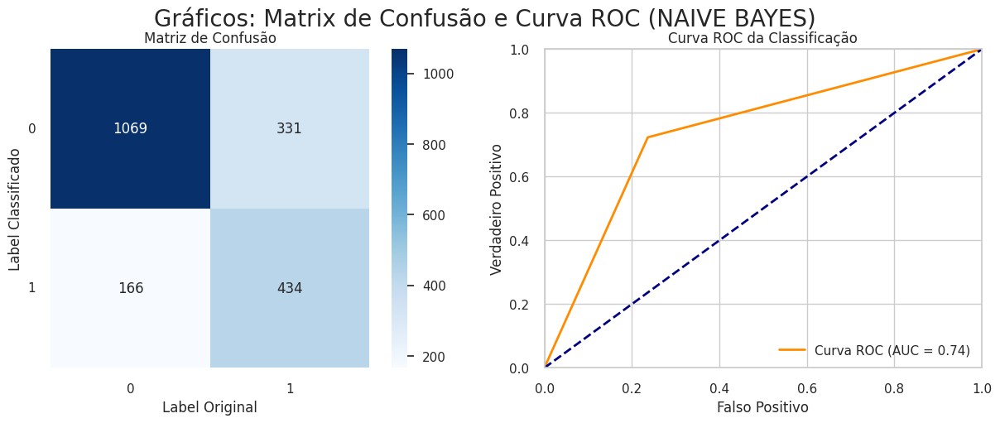

In [145]:
algorithm = 'Naive Bayes'
results_metrics(algorithm, df_results)
plot_ROC_CM(algorithm, y_test, predictions[algorithm])

Nota-se que o Naive Bayes teve perfomance abaixo do esperado, embora tenha tido uma performance aceitável na validação, bem como tenha apresentado acurácia de teste relativamente boa. As razões dessa avaliação são resumidas abaixo: 

* A Curva ROC mais próxima da diagonal, o que indica maior a tendência da classificação ser puramente aleatória. 

* Observando a matriz de confusão, observamos que os valores de falsos positivos e de falsos negativos estão relativamente altos. Isso demonstram que o algoritmo possui baixa sensibilidade para classificar corretamente os valores, o que implica em baixa pontuação no F1-Score.

#### Logistic Regression

			DADOS DOS RESULTADOS DO CLASSIFICADOR LOGISTIC REGRESSION
Treino:
	Accuracy (Treino):	 0.8992
	Precision (Treino):	 0.8674
	Recall (Treino):	 0.7839
	F1Score (Treino):	 0.8236
Validação:
	Accuracy (Validação):	 0.8986
	Precision (Validação):	 0.8667
	Recall (Validação):	 0.7825
	F1Score (Validação):	 0.8223
Teste:
	Accuracy (Teste):	 0.9070
	Precision (Teste):	 0.8619
	Recall (Teste):		 0.8217
	F1Score (Teste):	 0.8413


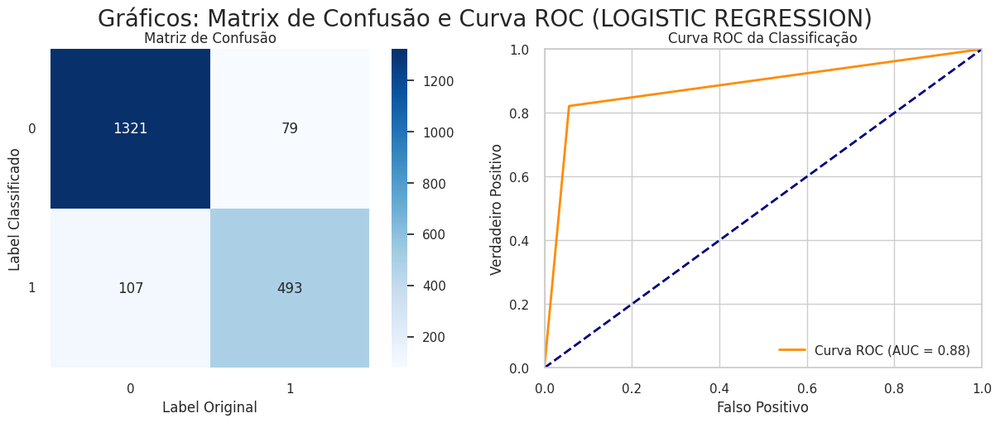

In [146]:
algorithm = 'Logistic Regression'
results_metrics(algorithm, df_results)
plot_ROC_CM(algorithm, y_test, predictions[algorithm])

O modelo Logistic Regression apresenta performance relativamente elevada. As razões para essa avaliação estão correlacionadas abaixo:

* A Curva ROC encontra-se distante da diagonal, mostrando consistência na classificação.

* O modelo apresenta performance mediana em relação ao precision e recall. Isto é, o modelo possui mediana ou elevada sensibilidade ao conjunto de dados, sendo certo que os valores de recall prejudicam a métrica F1-Score.

* Vale acrescentar que o modelo apresentou estabilidade no treinamento, validação e nos testes, sendo esta característica positiva uma vez que demonstra que não está sujeito a underfitting ou overfitting.

#### K-Nearest Neighbors

			DADOS DOS RESULTADOS DO CLASSIFICADOR K-NEAREST NEIGHBORS
Treino:
	Accuracy (Treino):	 0.9995
	Precision (Treino):	 1.0000
	Recall (Treino):	 0.9983
	F1Score (Treino):	 0.9992
Validação:
	Accuracy (Validação):	 0.8869
	Precision (Validação):	 0.8368
	Recall (Validação):	 0.7737
	F1Score (Validação):	 0.8040
Teste:
	Accuracy (Teste):	 0.8945
	Precision (Teste):	 0.8430
	Recall (Teste):		 0.7967
	F1Score (Teste):	 0.8192


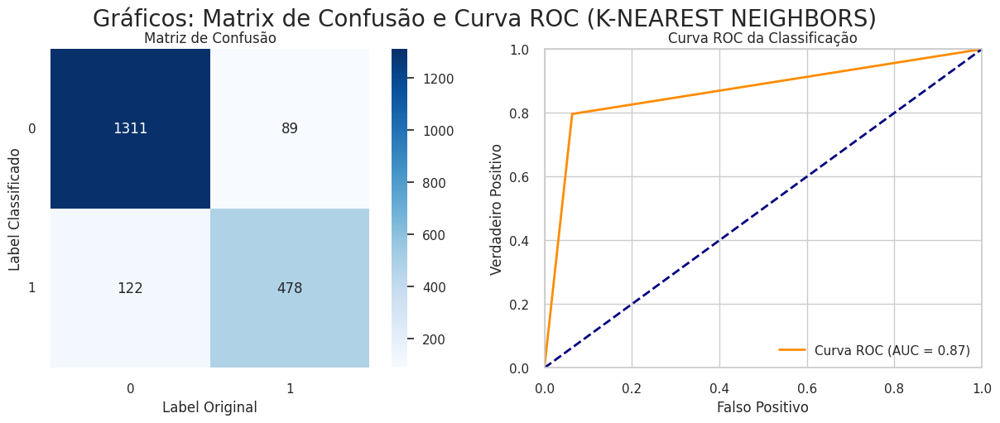

In [147]:
algorithm = 'K-Nearest Neighbors'
results_metrics(algorithm, df_results)
plot_ROC_CM(algorithm, y_test, predictions[algorithm])

O modelo k-Nearest Neighbors apresenta performance relativamente elevada. As razões para essa avaliação estão correlacionadas abaixo:

* A Curva ROC encontra-se distante da diagonal, mostrando consistência na classificação.

* O modelo apresenta performance mediana em relação ao precision e recall. Isto é, o modelo possui mediana ou elevada sensibilidade ao conjunto de dados, sendo certo que os valores de recall prejudicam a métrica F1-Score.

* Vale acrescentar que o modelo apresentou relativa estabilidade, pois, embora tenha demonstrado relativa tendência ao overfitting no treinamento e nas validações, ele foi coerente nos resultados do treinamento e testes.

#### Support Vector Classification

			DADOS DOS RESULTADOS DO CLASSIFICADOR SUPPORT VECTOR CLASSIFICATION
Treino:
	Accuracy (Treino):	 0.9005
	Precision (Treino):	 0.8832
	Recall (Treino):	 0.7701
	F1Score (Treino):	 0.8228
Validação:
	Accuracy (Validação):	 0.8995
	Precision (Validação):	 0.8826
	Recall (Validação):	 0.7673
	F1Score (Validação):	 0.8209
Teste:
	Accuracy (Teste):	 0.9065
	Precision (Teste):	 0.8748
	Recall (Teste):		 0.8033
	F1Score (Teste):	 0.8375


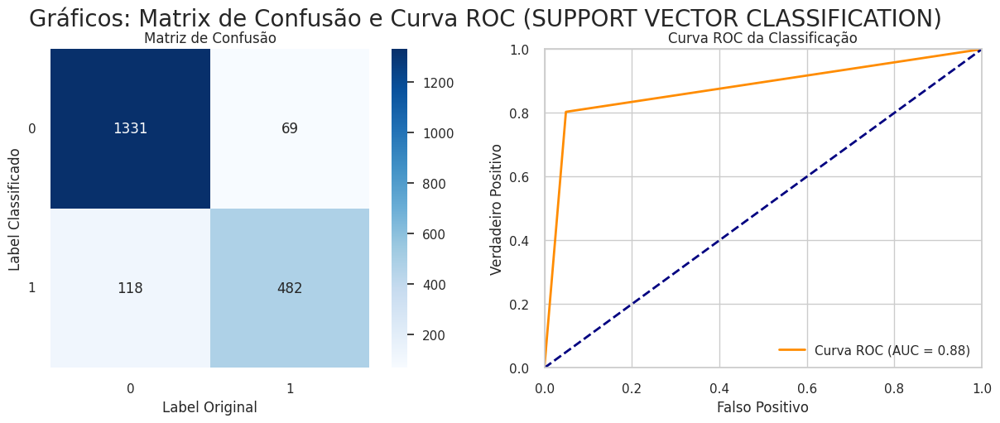

In [148]:
algorithm = 'Support Vector Classification'
results_metrics(algorithm, df_results)
plot_ROC_CM(algorithm, y_test, predictions[algorithm])

O modelo Suppport Vector Machine apresenta performance relativamente elevada. As razões para essa avaliação estão correlacionadas abaixo:

* A Curva ROC encontra-se distante da diagonal, mostrando consistência na classificação.

* O modelo apresenta performance mediana em relação ao precision e recall. Isto é, o modelo possui mediana ou elevada sensibilidade ao conjunto de dados, sendo certo que os valores de recall prejudicam a métrica F1-Score.

* Vale acrescentar que o modelo apresentou estabilidade no treinamento, validação e nos testes, sendo esta característica positiva uma vez que demonstra que não está sujeito a underfitting ou overfitting.

#### Ridge Classifier

			DADOS DOS RESULTADOS DO CLASSIFICADOR RIDGE CLASSIFIER
Treino:
	Accuracy (Treino):	 0.8945
	Precision (Treino):	 0.9065
	Recall (Treino):	 0.7229
	F1Score (Treino):	 0.8043
Validação:
	Accuracy (Validação):	 0.8934
	Precision (Validação):	 0.9043
	Recall (Validação):	 0.7204
	F1Score (Validação):	 0.8019
Teste:
	Accuracy (Teste):	 0.9030
	Precision (Teste):	 0.8949
	Recall (Teste):		 0.7667
	F1Score (Teste):	 0.8259


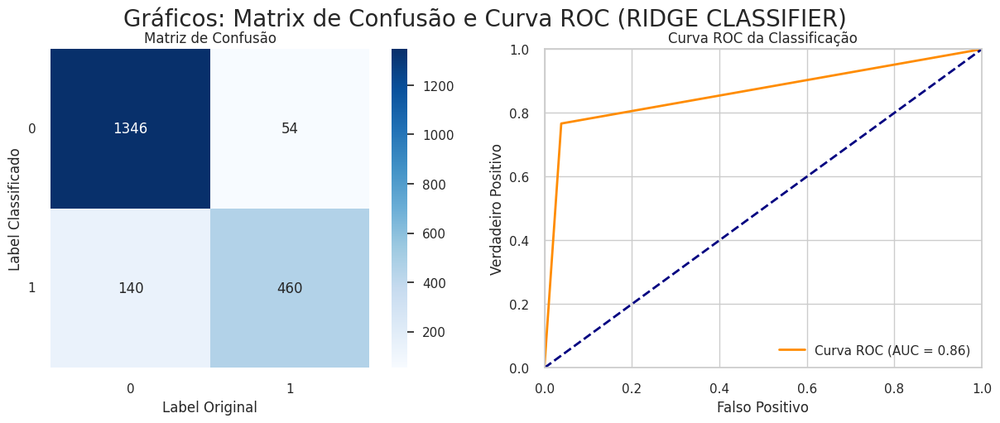

In [149]:
algorithm = 'Ridge Classifier'
results_metrics(algorithm, df_results)
plot_ROC_CM(algorithm, y_test, predictions[algorithm])

O modelo Ridge Classifier apresenta performance relativamente elevada. As razões para essa avaliação estão correlacionadas abaixo:

* A Curva ROC encontra-se distante da diagonal, mostrando consistência na classificação.

* O modelo apresenta performance elevada em relação ao precision, porém mediana em relação ao recall. Isto é, os valores de recall mostram baixa sensibilidade aos dados e prejudicam a métrica F1-Score.

* Vale acrescentar que o modelo apresentou estabilidade no treinamento, validação e nos testes, sendo esta característica positiva uma vez que demonstra que não está sujeito a underfitting ou overfitting.

#### ExtraTreeClass

			DADOS DOS RESULTADOS DO CLASSIFICADOR EXTRATREECLASS
Treino:
	Accuracy (Treino):	 0.9995
	Precision (Treino):	 1.0000
	Recall (Treino):	 0.9984
	F1Score (Treino):	 0.9992
Validação:
	Accuracy (Validação):	 0.9066
	Precision (Validação):	 0.8705
	Recall (Validação):	 0.8094
	F1Score (Validação):	 0.8387
Teste:
	Accuracy (Teste):	 0.9140
	Precision (Teste):	 0.8690
	Recall (Teste):		 0.8400
	F1Score (Teste):	 0.8542


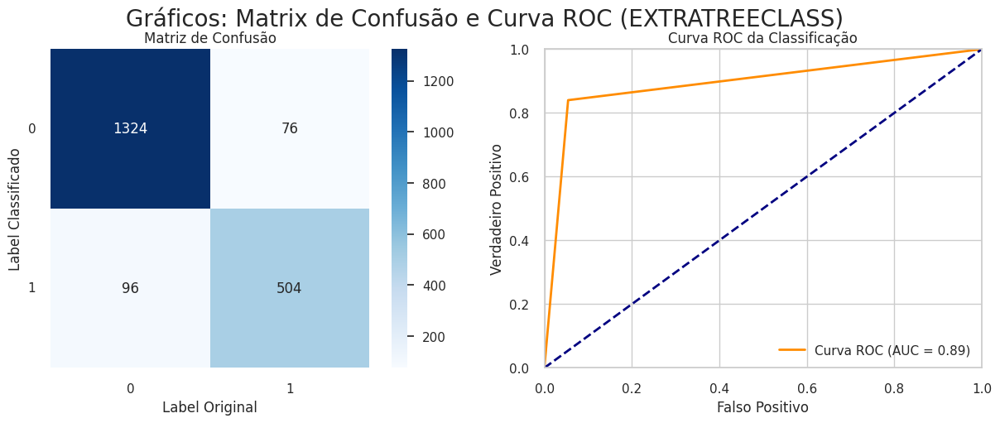

In [150]:
algorithm = 'ExtraTreeClass'
results_metrics(algorithm, df_results)
plot_ROC_CM(algorithm, y_test, predictions[algorithm])

O modelo Extra Tree Class apresenta performance relativamente elevada. As razões para essa avaliação estão correlacionadas abaixo:

* A Curva ROC encontra-se distante da diagonal, mostrando consistência na classificação.

* O modelo apresenta performance equilibrada em relação ao precision e recall. Isto é, o modelo possui mediana ou elevada sensibilidade ao conjunto de dados, sendo certo que os valores de recall tendam a prejudicar a métrica F1-Score.

* Vale acrescentar que o modelo apresentou tendência ao overfitting no treinamento.

#### Random Forest

			DADOS DOS RESULTADOS DO CLASSIFICADOR RANDOM FOREST
Treino:
	Accuracy (Treino):	 0.9995
	Precision (Treino):	 0.9998
	Recall (Treino):	 0.9985
	F1Score (Treino):	 0.9992
Validação:
	Accuracy (Validação):	 0.9133
	Precision (Validação):	 0.8971
	Recall (Validação):	 0.8029
	F1Score (Validação):	 0.8473
Teste:
	Accuracy (Teste):	 0.9235
	Precision (Teste):	 0.8834
	Recall (Teste):		 0.8583
	F1Score (Teste):	 0.8707


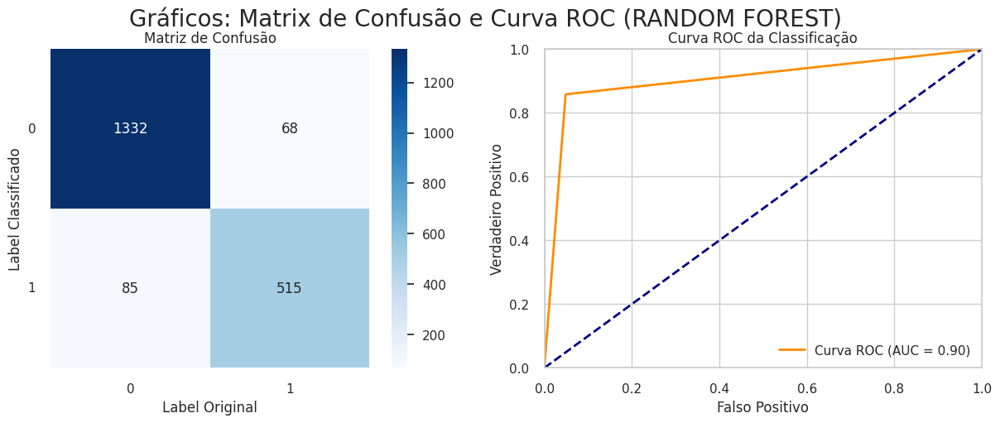

In [151]:
algorithm = 'Random Forest'
results_metrics(algorithm, df_results)
plot_ROC_CM(algorithm, y_test, predictions[algorithm])

O modelo do Random Forest apresenta performance relativamente elevada. As razões para essa avaliação estão correlacionadas abaixo:

* A Curva ROC encontra-se distante da diagonal, mostrando consistência na classificação.

* O modelo apresenta performance equilibrada em relação ao precision e ao recall. Isto é, o modelo possui elevada sensibilidade ao conjunto de dados, sendo certo o equilíbrio entre os valores de recall e de precision elevam a métrica F1-Score.

* Vale acrescentar que o modelo apresentou tendência de overfitting no treinamento, mas apresentou elevados níveis de resultados nas validações e nos testes.

#### DecisionTree

			DADOS DOS RESULTADOS DO CLASSIFICADOR DECISIONTREE
Treino:
	Accuracy (Treino):	 0.9995
	Precision (Treino):	 1.0000
	Recall (Treino):	 0.9983
	F1Score (Treino):	 0.9992
Validação:
	Accuracy (Validação):	 0.8875
	Precision (Validação):	 0.8081
	Recall (Validação):	 0.8197
	F1Score (Validação):	 0.8137
Teste:
	Accuracy (Teste):	 0.8875
	Precision (Teste):	 0.7837
	Recall (Teste):		 0.8633
	F1Score (Teste):	 0.8216


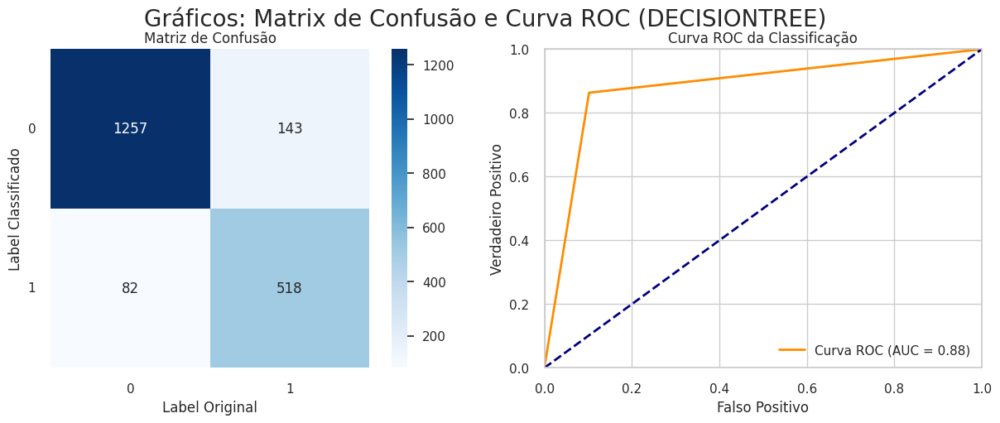

In [152]:
algorithm = 'DecisionTree'
results_metrics(algorithm, df_results)
plot_ROC_CM(algorithm, y_test, predictions[algorithm])

O modelo Decision Tree apresenta performance relativamente elevada. As razões para essa avaliação estão correlacionadas abaixo:

* A Curva ROC encontra-se distante da diagonal, mostrando consistência na classificação.

* O modelo apresenta performance mediana em relação ao precision e recall. Isto é, o modelo possui mediana ou elevada sensibilidade ao conjunto de dados, sendo certo que os valores de precision prejudicam a métrica F1-Score.

* Vale acrescentar que o modelo apresentou tendência ao overfitting no treinamento, porém apresentou elevados resultados nas validações e nos testes.

#### Perceptron

			DADOS DOS RESULTADOS DO CLASSIFICADOR PERCEPTRON
Treino:
	Accuracy (Treino):	 0.8623
	Precision (Treino):	 0.8307
	Recall (Treino):	 0.7289
	F1Score (Treino):	 0.7607
Validação:
	Accuracy (Validação):	 0.8598
	Precision (Validação):	 0.8217
	Recall (Validação):	 0.7354
	F1Score (Validação):	 0.7601
Teste:
	Accuracy (Teste):	 0.8990
	Precision (Teste):	 0.8554
	Recall (Teste):		 0.7983
	F1Score (Teste):	 0.8259


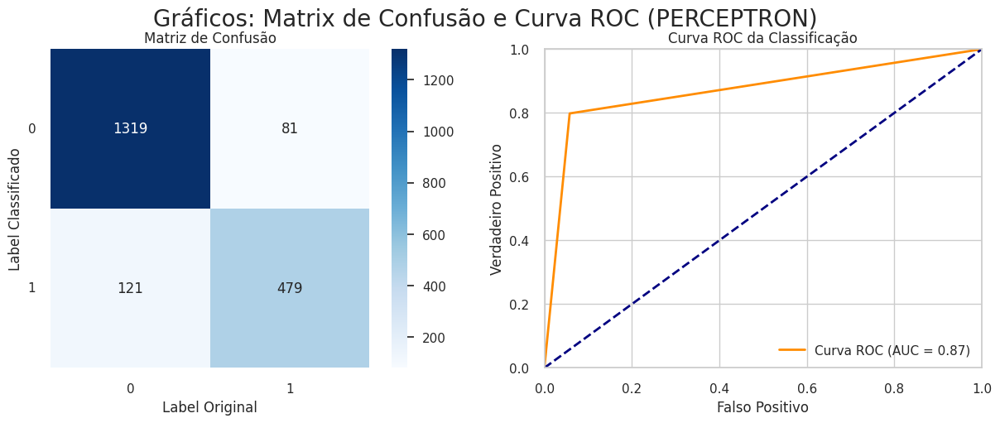

In [153]:
algorithm = 'Perceptron'
results_metrics(algorithm, df_results)
plot_ROC_CM(algorithm, y_test, predictions[algorithm])

O modelo Perceptron apresenta performance relativamente elevada. As razões para essa avaliação estão correlacionadas abaixo:

* A Curva ROC encontra-se distante da diagonal, mostrando consistência na classificação.

* O modelo apresenta performance mediana em relação ao precision e recall. Isto é, o modelo possui mediana ou elevada sensibilidade ao conjunto de dados, mas os valores de precision prejudicam severamente a métrica F1-Score.

* Vale acrescentar que o modelo apresentou estabilidade no treinamento, validação e nos testes, sendo esta característica positiva uma vez que demonstra que não está sujeito a underfitting ou overfitting.

#### MLPClassifier

			DADOS DOS RESULTADOS DO CLASSIFICADOR MLPCLASSIFIER
Treino:
	Accuracy (Treino):	 0.9093
	Precision (Treino):	 0.8747
	Recall (Treino):	 0.8150
	F1Score (Treino):	 0.8437
Validação:
	Accuracy (Validação):	 0.9032
	Precision (Validação):	 0.8652
	Recall (Validação):	 0.8040
	F1Score (Validação):	 0.8331
Teste:
	Accuracy (Teste):	 0.9075
	Precision (Teste):	 0.8621
	Recall (Teste):		 0.8233
	F1Score (Teste):	 0.8423


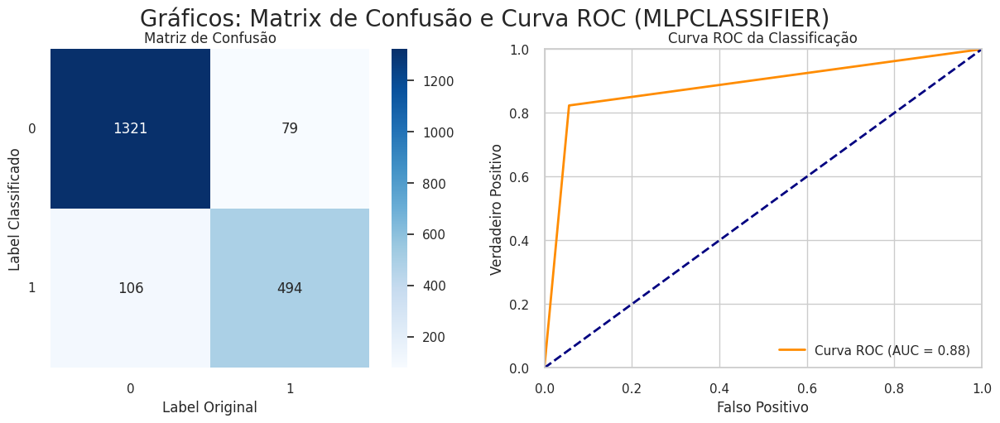

In [154]:
algorithm = 'MLPClassifier'
results_metrics(algorithm, df_results)
plot_ROC_CM(algorithm, y_test, predictions[algorithm])

O modelo Multilayer Perceptron apresenta performance relativamente elevada. As razões para essa avaliação estão correlacionadas abaixo:

* A Curva ROC encontra-se distante da diagonal, mostrando consistência na classificação.

* O modelo apresenta performance mediana em relação ao precision e recall. Isto é, o modelo possui mediana ou elevada sensibilidade ao conjunto de dados, sendo certo que os valores de recall prejudicam a métrica F1-Score.

* Vale acrescentar que o modelo apresentou estabilidade no treinamento, validação e nos testes, sendo esta característica positiva uma vez que demonstra que não está sujeito a underfitting ou overfitting.

### Avaliação geral

#### Por que o F1Score?

Escolhemos o F1Score como critério de análise por dois motivos: 

* A `Acurácia não seria uma boa métrica de performance por causa do desbalanceamento dos dados`.
* O `F1-Score é uma boa alternativa por ele ser a média harmônica da Precisão e do Recall`, ou seja, esse parâmetro consegue exprimir em uma única medida o equilíbrio entre as duas medidas alvo. Ou seja, isso está de acordo com os objetivos do presente trabalho, pois desejamos aumentar a taxa de acertos dos diagnósticos dos indivíduos adoecidos que são diabéticos e evitar a classificação equivocada de indivíduos sadios como sendo diabéticos.

#### Comparação dos Valores Coletados

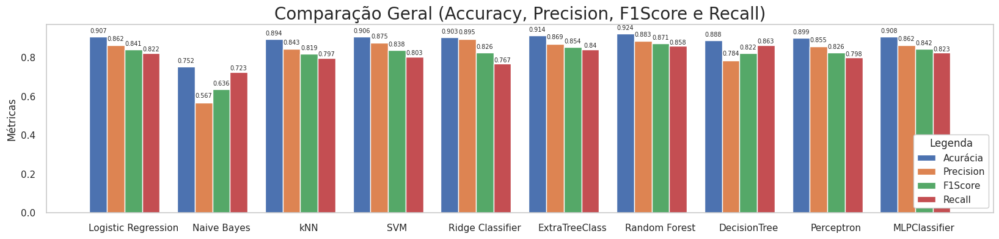

In [155]:
# Coletando dados do eixo X
X = df_results["Classificador"]

# Ajustando nomes para melhorar visualização do gráfico
for index, value in enumerate(X):
    if value == 'Support Vector Classification':
        X[index] = 'SVM'
    if value == 'K-Nearest Neighbors':
        X[index] = 'kNN'

# Coletando dados do eixo Y
X_axis = np.arange(len(X))
accuracy = df_results["Accuracy (Teste)"]
f1scores = df_results["F1Score (Teste)"]
precisions = df_results["Precision (Teste)"]
recall = df_results["Recall (Teste)"]

# Criando gráfico
plt.figure(figsize=(20,4))
plt.bar(X_axis - 0.4, accuracy, 0.2, label="Acurácia")
plt.bar(X_axis - 0.2, precisions, 0.2, label="Precision")
plt.bar(X_axis, f1scores, 0.2, label = "F1Score")
plt.bar(X_axis + 0.2, recall, 0.2, label="Recall")

for i in X_axis:
    number = accuracy[i]
    writing = round(number, 3)
    plt.text(i-0.4, number + 0.02, writing, ha="center", rotation=0, fontsize=7)

    number = f1scores[i]
    writing = round(number, 3)
    plt.text(i, number + 0.02, writing, ha="center", rotation=0, fontsize=7)

    number = precisions[i]
    writing = round(number, 3)
    plt.text(i-0.2, number +0.025, writing, rotation=0, ha="center", fontsize=7)

    number = recall[i]
    writing = round(number, 3)
    plt.text(i+0.2, number+0.01, writing, rotation=0, ha="center", fontsize=7)

plt.title("Comparação Geral (Accuracy, Precision, F1Score e Recall)", fontsize=20)
plt.ylabel("Métricas")
plt.xticks(X_axis, X, rotation=0)
plt.legend(title='Legenda', loc='lower right', frameon=True, framealpha=1, edgecolor='inherit', facecolor='inherit')
plt.grid(False)
plt.show()

### Seleção dos Melhores Algoritmos e a Escolha do Modelo Final

Com base nas avaliações individuais e no gráfico acima, percebemos que os algoritmos `Logistic Regression, ExtraTreeClass, MLPClassifier e o Random Forest performaram melhor`. Porém, dois deles apresentam melhor estabilidade e equilíbrio nas métricas de precision e recall (fornecidas pela F1Score): MLPClassifier e Random Forest. Por fim, o `Random Forest foi o melhor modelo`, uma vez que, em termos numéricos, suas métricas foram superiores às do MLPClassifier.

## Finalizando o Projeto

Uma vez selecionado o melhor modelo de classificação, iremos realizar as duas últimas etapas do projeto:

* A primeira etapa é realizar o treinamento do modelo selecionado utilizando os parâmetros otimizados pelo GridSearchCV e a amostragem de treinamento (previamente separadas em 80% treino e 20% teste). Logo em seguida, deveremos avaliar rapidamente o treinamento com os dados de testes. 
* A segunda etapa é classificar todo o banco de dados com 100.000 registros com o modelo treinado, bem como avaliarmos os resultados finais.

### Primeira Etapa: Treinamento do Modelo e Classificação da Amostragem

#### Treinamento do Modelo Selecionado

In [156]:
# Recuperando melhore valores de parâmetros
random_forest = df_results.loc[df_results['Classificador'] == 'Random Forest']

# Aplicando ao parâmetros ao modelo de dados
final_model = RandomForestClassifier(**random_forest.iloc[0,16])

# Treinamento do modelo
final_model.fit(X_train, y_train)

RandomForestClassifier(criterion='log_loss', n_estimators=300)

#### Avaliação

			METRICAS DE AVALIAÇÃO
Acuracia: 91.85%
Precision: 87.22%
Recall: 85.33%
F1Score: 86.27%


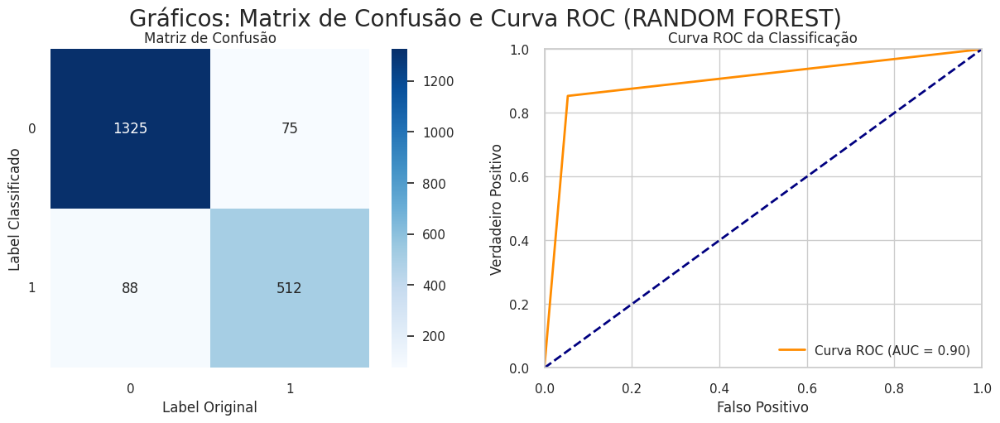

In [157]:
# Avaliação do Modelo Treinado com as Amostragens
predicted = final_model.predict(X_test)

print("\t\t\tMETRICAS DE AVALIAÇÃO")
print(f"Acuracia: {accuracy_score(y_test, predicted)*100:.2f}%")
print(f"Precision: {precision_score(y_test, predicted)*100:.2f}%")
print(f"Recall: {recall_score(y_test, predicted)*100:.2f}%")
print(f"F1Score: {f1_score(y_test, predicted)*100:.2f}%")
plot_ROC_CM('Random Forest', y_test, predicted)

### Segunda Etapa: Classificação da Base de Dados Completa

Abaixo `testaremos o modelo realizando a classificação da base de dados completa`. Por isso, `repetiremos o mesmo procedimento realizado na seleção do modelo`.

#### Carregar Dataset Completo

In [158]:
# Carregar Dataset Completo
df = pd.read_csv(path)

# Divisão dos dados
x, y = df.drop('diabetes', axis=1), df['diabetes']
print('(X train, Y train):', x.shape, y.shape)

(X train, Y train): (100000, 8) (100000,)


#### Transformação e Classificação dos Dados

In [159]:
# Criando novos objetos para não enviesar a classificação
encoder_gender = LabelEncoder()
encoder_smoking = LabelEncoder()

# Transformando dados categóricos em dados numéricos
x['gender'] = encoder_gender.fit_transform(x['gender'])
x['smoking_history'] = encoder_smoking.fit_transform(x['smoking_history'])

# Desconsiderando ordem dos dados categóricos
x_dummies = pd.get_dummies(x, columns=['gender', 'smoking_history'])

# Escalonando valores
x = MinMaxScaler().fit_transform(x_dummies)

# Classificação dos dados de Acordo com Modelo Treinado
predicted = final_model.predict(x)

#### Avaliação Final

			METRICAS DE AVALIAÇÃO
Acuracia: 96.19%
Precision: 76.51%
Recall: 79.53%
F1Score: 77.99%


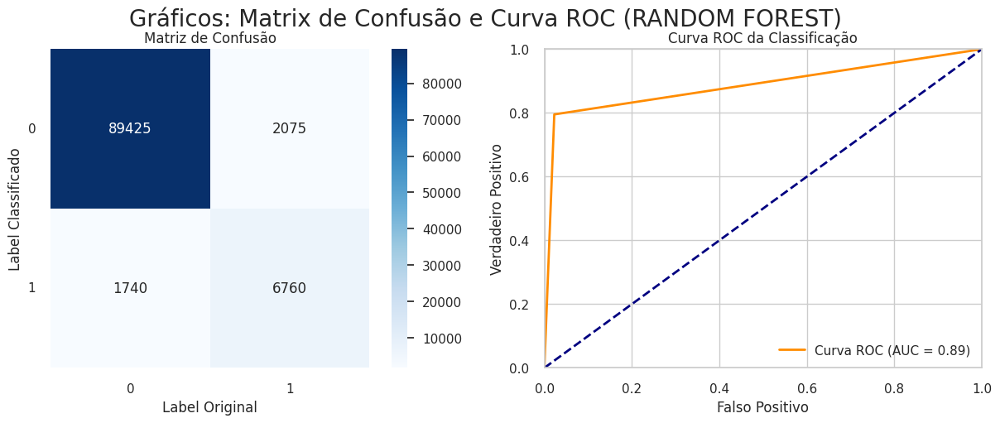

In [160]:
print("\t\t\tMETRICAS DE AVALIAÇÃO")
print(f"Acuracia: {accuracy_score(y, predicted)*100:.2f}%")
print(f"Precision: {precision_score(y, predicted)*100:.2f}%")
print(f"Recall: {recall_score(y, predicted)*100:.2f}%")
print(f"F1Score: {f1_score(y, predicted)*100:.2f}%")
plot_ROC_CM('Random Forest', y, predicted)

# CONCLUSÃO

Podemos concluir afirmando que os objetivos do projeto foram atingidos com sucesso uma vez que utilizamos as ferramentas de Ciência de Dados para interpretar e classificar o banco de dados proposto. Em breve restrospecto, realizamos uma extensa análise exploratória, momento em que pudemos observar com cuidado características exclusivas dos dados, bem como possíveis outliers e desbalanceamento de dados. Na sequência, a seleção de modelos proporcionou uma verdadeira trajetória no Machine Learning já que testamos algoritmos clássicos (como Naive Bayes, Logistic Regression, Support Vector Machine, Perceptron e outros), assim como algoritmos de clusterização (K-Means, DBScan e Agglomerative Clustering). Além disso, utilizamos técnicas de validação (KFold) combinadas com técnicas de otimização de hiperparâmetros (GridSearchCV), as quais aumentaram a eficiência da classificação ao mesmo tempo em que evitaram o overfitting e o underfitting. Ao final, selecionamos o algoritmo Random Forest como sendo o mais eficiente e performático, obtendo uma classificação da base de dados completa com aproximadamente 96% de acurácia. Assim, verifica-se que é possível utilizar os algoritmos de Machine Learning combinados com as técnicas de Ciência de Dados para realizar a classificação de pessoas potencialmente sujeitas ou acometidas pelo diabetes. Esse cenário se mostra ainda mais promissor quando observamos que a taxa de acerto de diagnósticos humanos oscila próximo a 90% de acerto (vide bibliografia), mas a acurácia dos métodos de acima utilizados permitiu obter acurácia superior, no valor aproximado de 96%.

# BIBLIOGRAGIA

- Hall KK, Shoemaker-Hunt S, Hoffman L, et al. Making Healthcare Safer III: A Critical Analysis of Existing and Emerging Patient Safety Practices [Internet]. Rockville (MD): Agency for Healthcare Research and Quality (US); 2020 Mar. 1, Diagnostic Errors. Available from: https://www.ncbi.nlm.nih.gov/books/NBK555525/

- MUSTAFA, Mohammed. Diabetes Prediction Dataset - a comprehensive DataSet for Predicting Diabetes with Medical & Demographic Data. Disponível em: https://www.kaggle.com/datasets/iammustafatz/diabetes-prediction-dataset/data

- Sociedade Brasileira de Diabetes. Disponível em: https://diabetes.org.br/

- W. J. C. dos Santos, M. R. C. dos Santos, and L. T. C. dos Santos, “Comparativo do percentual de erros em diagnóstico médico entre neurônios naturais e artificiais”, Editora, pp. 429–435, May 2023. Disponível em: https://sevenpublicacoes.com.br/index.php/editora/article/view/1290